In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

c:\Users\Antonio\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# data

In [2]:
np.random.seed(42)

In [3]:
N_CLUSTER = 3

In [4]:
CORRELATION = 0.1

In [ ]:
NOISE_STD = 

In [6]:
N_SAMPLE = 2500

In [7]:
N_FEATURES = 15

In [8]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[5.0, 3.5, 2],
                             separation_factor=2.0,
                             sample_distribution=[1250,625,625],
                             random_state=42)

In [9]:
X.shape

(2500, 16)

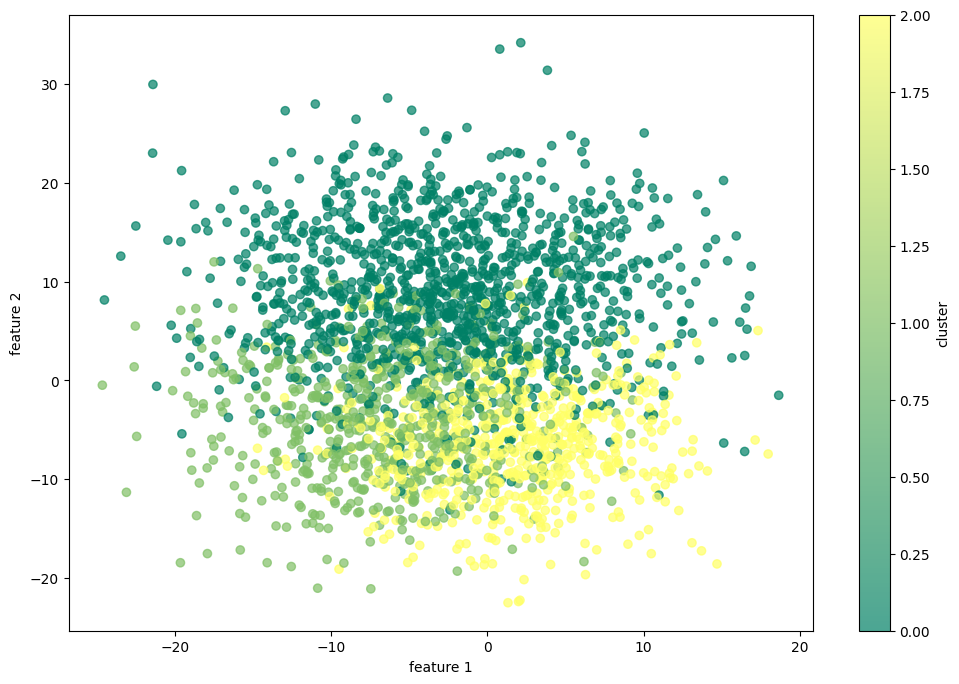

In [10]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'],c=X['target'],cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

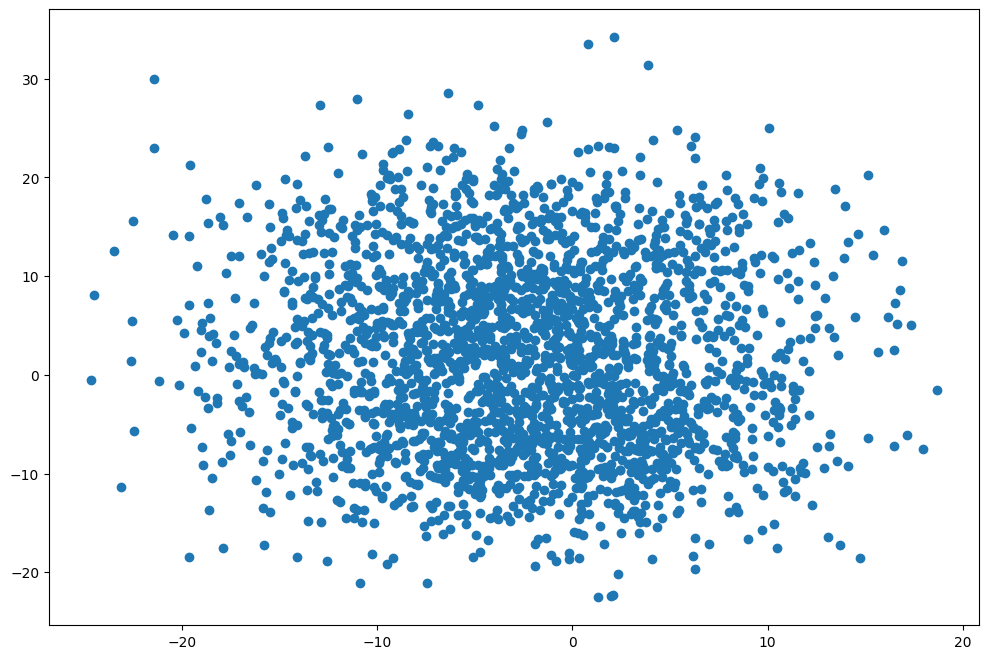

In [11]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [12]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [13]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15
var_1,1.000000,-0.048027,-0.196906,0.212597,0.195727,0.050710,0.110667,-0.078056,0.178126,-0.025104,-0.190223,0.082574,-0.193033,0.125579,0.141892
var_2,-0.048027,1.000000,0.427731,-0.129547,-0.413809,-0.472528,-0.216071,0.577194,0.028563,0.273876,-0.320996,0.496022,0.482988,-0.495626,-0.002593
var_3,-0.196906,0.427731,1.000000,-0.230449,-0.460412,-0.365697,-0.209236,0.428552,-0.093269,0.203116,-0.060547,0.261645,0.462341,-0.394820,-0.075801
var_4,0.212597,-0.129547,-0.230449,1.000000,0.318965,0.142176,0.141383,-0.157053,0.176066,-0.052373,-0.209600,0.049492,-0.286976,0.209066,0.123395
var_5,0.195727,-0.413809,-0.460412,0.318965,1.000000,0.420358,0.200865,-0.418862,0.115223,-0.241432,0.001896,-0.195941,-0.477324,0.446881,0.076786
var_6,0.050710,-0.472528,-0.365697,0.142176,0.420358,1.000000,0.215423,-0.451573,-0.012556,-0.266197,0.217239,-0.393466,-0.445064,0.445114,-0.000410
var_7,0.110667,-0.216071,-0.209236,0.141383,0.200865,0.215423,1.000000,-0.215611,-0.014549,-0.122794,-0.015057,-0.140709,-0.252752,0.191634,0.074124
var_8,-0.078056,0.577194,0.428552,-0.157053,-0.418862,-0.451573,-0.215611,1.000000,0.005459,0.307463,-0.277396,0.464569,0.497801,-0.489274,-0.011553
var_9,0.178126,0.028563,-0.093269,0.176066,0.115223,-0.012556,-0.014549,0.005459,1.000000,0.031468,-0.202009,0.117329,-0.063367,0.022476,0.077324
var_10,-0.025104,0.273876,0.203116,-0.052373,-0.241432,-0.266197,-0.122794,0.307463,0.031468,1.000000,-0.177526,0.255939,0.252076,-0.249094,0.028870


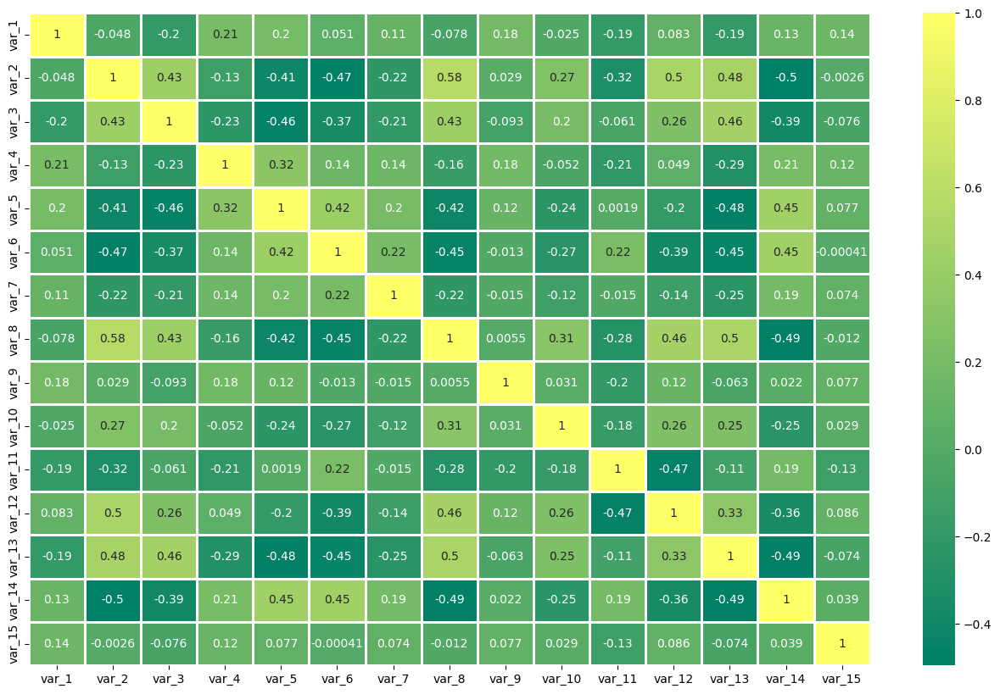

In [14]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

In [15]:
features = corr_dataset.iloc[:, :-1]

In [16]:
corr_matrix = features.corr()

In [17]:
pval_matrix = pd.DataFrame(
    np.ones((len(features.columns), len(features.columns))),
    columns=features.columns,
    index=features.columns
)

for i in range(len(features.columns)):
    for j in range(i+1, len(features.columns)):
        r, p = pearsonr(features.iloc[:, i], features.iloc[:, j])
        pval_matrix.iloc[i, j] = p
        pval_matrix.iloc[j, i] = p


print("Mean Absolute Correlation:", corr_matrix.abs().values[np.triu_indices_from(corr_matrix, k=1)].mean())
print("Max Correlation:", corr_matrix.max().max())
print("Min Correlation:", corr_matrix.min().min())

print("\nMean p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].mean())
print("Minimum p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].min())
print("Maximum p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].max())

Mean Absolute Correlation: 0.2204271387484941
Max Correlation: 1.0
Min Correlation: -0.49562611833930037

Mean p-value: 0.06285996289907464
Minimum p-value: 4.4689522045014776e-222
Maximum p-value: 0.983657226920683


## data standardization

In [18]:
X_values = corr_dataset.iloc[:,:-1].values

In [19]:
y_values = corr_dataset.iloc[:,-1].values

In [20]:
scaler = StandardScaler()

In [21]:
X_values = scaler.fit_transform(X_values)

In [22]:
np.mean(X_values),np.std(X_values)

(np.float64(-1.246765653680389e-16), np.float64(0.9999999999999996))

In [23]:
X_values = pd.DataFrame(X_values,columns=corr_dataset.iloc[:,:-1].columns)

In [24]:
X_values

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889


# dimensionality reduction algorithms

Summary Table

| Algorithm | Type | Preserves | Scalable | Notes |
|-----------|------|-----------|----------|------|
| **PCA** | Linear | Global variance | ✅ | Fast, good for linear correlations |
| **t-SNE** | Nonlinear | Local structure | ⚠️ | Great for visual clusters, slow for large datasets |
| **UMAP** | Nonlinear | Local + some global | ✅ | Fast, interpretable, scalable |


## pca

**PCA** is a **linear dimensionality reduction** technique that projects data onto a set of orthogonal axes (principal components) which capture the **maximum variance**.

1. Standardize the dataset (mean=0, variance=1).  
2. Compute the **covariance matrix** of the features.  
3. Compute **eigenvectors and eigenvalues** of the covariance matrix.  
4. Select the top `k` eigenvectors (principal components) and project the data onto them.

**Key Points:**
- Preserves **global structure and variance**  
- Produces a **linear embedding**  
- Each principal component is a linear combination of original features

**Strengths**
- Fast and deterministic  
- Works well for linear data correlations  
- Useful for noise reduction and preprocessing  

**Weaknesses**
- Cannot capture nonlinear structures  
- Sensitive to scaling of features  

In [25]:
pca_general = PCA()

In [26]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [27]:
explained_variance = pca_general.explained_variance_ratio_

In [28]:
explained_variance

array([0.30033935, 0.13454612, 0.06489189, 0.05995905, 0.05540881,
       0.0540072 , 0.05248509, 0.04465197, 0.04048139, 0.03670785,
       0.03430117, 0.03267276, 0.03182185, 0.03005699, 0.0276685 ])

In [29]:
eigenvalues = pca_general.explained_variance_

In [30]:
eigenvalues

array([4.50689299, 2.01899934, 0.97376793, 0.89974563, 0.83146479,
       0.81043214, 0.78759133, 0.67004761, 0.60746378, 0.55083813,
       0.5147235 , 0.49028748, 0.47751882, 0.45103533, 0.4151936 ])

In [31]:
eigenvalues[1]

np.float64(2.018999335264101)

In [32]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[np.float64(4.506892994709295), np.float64(2.018999335264101)]


In [33]:
N_COMPONENTS = len(selected_components)

In [34]:
eigenvectors = pca_general.components_

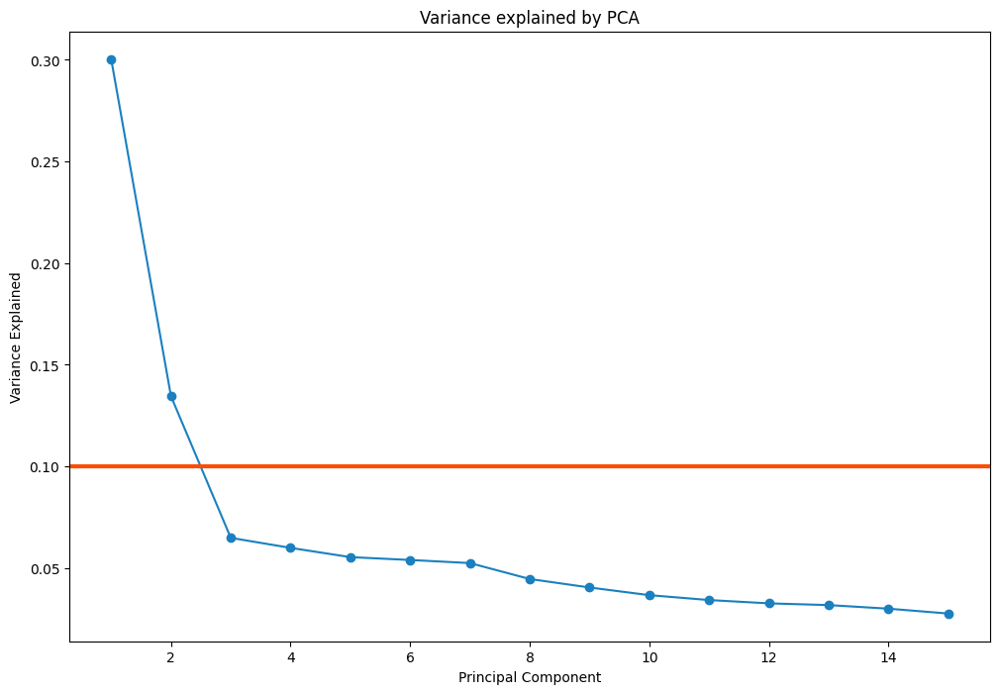

In [35]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [36]:
pca = PCA(n_components=N_COMPONENTS)

In [37]:
X_pca = pca.fit_transform(X_values)

In [38]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [39]:
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

In [40]:
X_pca

,dim_1,dim_2
0,3.302554,1.165642
1,1.760138,0.031350
2,-2.896813,-0.570498
3,0.779225,0.033066
4,2.486562,0.038089
...,...,...
2495,-2.297848,-1.418125
2496,-0.186148,1.385988
2497,-1.984767,-1.417433
2498,-1.298994,1.243779


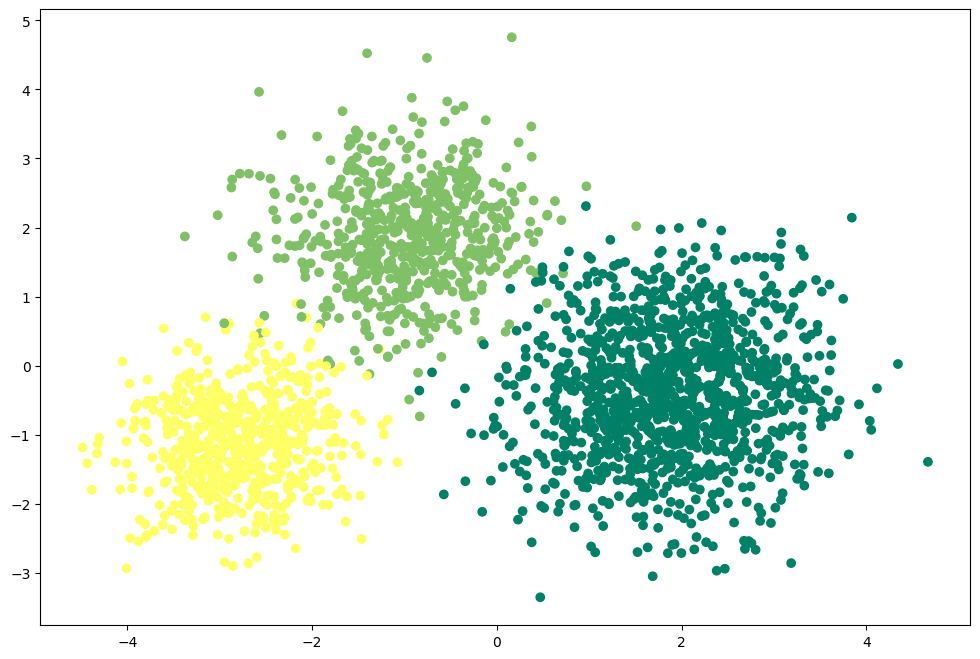

In [41]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_pca['dim_1'],y=X_pca['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## t-SNE

**t-SNE** is a **nonlinear technique** primarily used for **visualizing high-dimensional data** in 2 or 3 dimensions.

1. Compute **pairwise similarities** in high-dimensional space using conditional probabilities.  
2. Initialize points randomly in low-dimensional space.  
3. Minimize the **Kullback–Leibler divergence** between high-dimensional and low-dimensional similarity distributions via gradient descent.  
4. Emphasizes **local neighborhood preservation**, sometimes at the expense of global structure.

**Key Points:**
- Focuses on preserving **local structure** (nearby points remain close)  
- Often used for **visualizing clusters** in 2D/3D plots  

**Strengths**
- Captures complex, nonlinear relationships  
- Reveals hidden patterns and clusters visually  

**Weaknesses**
- Computationally expensive for large datasets  
- Non-deterministic unless `random_state` is fixed  
- Poor at preserving global distances  


In [42]:
tsne = TSNE(n_components=3,random_state=42)

In [43]:
X_tsne = tsne.fit_transform(X_values)

In [44]:
X_tsne = pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3'))

In [45]:
X_tsne 

,dim_1,dim_2,dim_3
0,2.993417,1.466981,4.298259
1,18.101969,3.602019,-9.118330
2,-23.710184,-24.853226,-5.859434
3,31.015869,5.337931,-11.716872
4,8.539289,-23.890591,-4.554605
...,...,...,...
2495,-21.188536,0.642407,8.198753
2496,-13.461441,2.161455,24.117638
2497,-31.398249,-9.028354,-15.616220
2498,-17.318478,12.477765,-6.362691


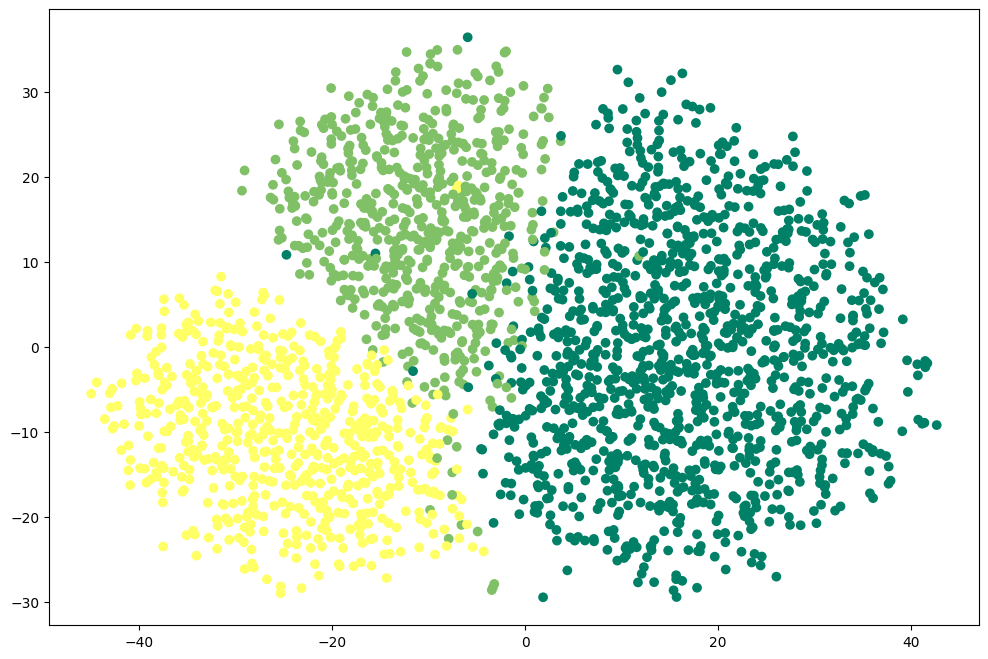

In [46]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_tsne['dim_1'],y=X_tsne['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## umap

**UMAP** is a **nonlinear dimensionality reduction** technique based on **manifold learning and topological data analysis**.  
It aims to preserve both **local and some global structure** in a low-dimensional embedding.

1. Construct a **nearest-neighbor graph** of the high-dimensional data.  
2. Estimate a **fuzzy topological structure** (simplicial complex).  
3. Optimize a **cross-entropy loss** to map the high-dimensional structure into a lower-dimensional space.  
4. Output is a low-dimensional embedding suitable for visualization or clustering.

**Key Points:**
- Can capture **nonlinear structures** efficiently  
- Usually faster and more scalable than t-SNE  
- Balances **local neighborhood preservation** with **global structure**

**Strengths**
- Handles large datasets efficiently  
- Preserves both local and some global patterns  
- Often produces more interpretable embeddings than t-SNE  

**Weaknesses**
- Sensitive to data scaling and preprocessing  


In [47]:
umap = umap.UMAP(n_components=3,random_state=42)

In [48]:
X_umap = umap.fit_transform(X_values)

In [49]:
X_umap = pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3'))

In [50]:
X_umap

,dim_1,dim_2,dim_3
0,11.330358,3.415561,4.021476
1,11.536426,2.995864,3.383035
2,0.527259,3.063997,3.603730
3,12.776800,2.446049,4.531347
4,11.153504,1.900840,3.846563
...,...,...,...
2495,1.328441,2.375354,3.297320
2496,5.286746,6.800919,4.354907
2497,1.027787,2.506734,4.103840
2498,6.608165,7.033211,4.317453


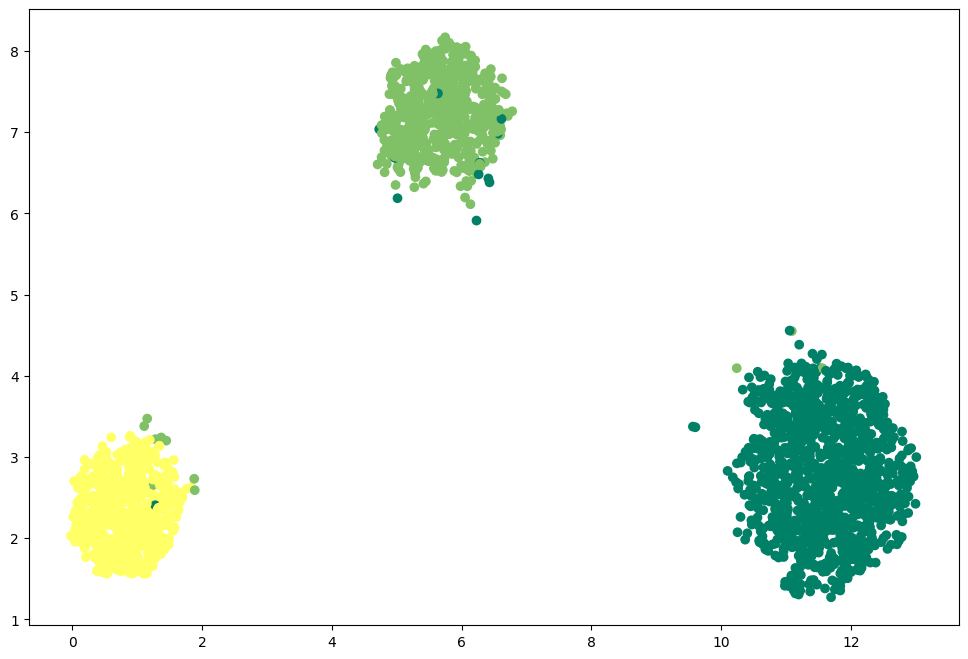

In [51]:
fig = plt.figure(figsize=(12,8))
plt.scatter(X_umap['dim_1'],X_umap['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

# clustering algorithms

| Algorithm | Type | Handles Nonlinear Shapes | Robust to Outliers | Scalable | Notes |
|------------|------|--------------------------|--------------------|-----------|-------|
| **K-Means** | Centroid-based | ❌ | ❌ | ✅ | Simple, fast, but assumes spherical clusters |
| **BIRCH** | Hierarchical | ⚠️ Partial | ⚠️ Partial | ✅✅ | Excellent for very large data |
| **GMM** | Probabilistic | ✅ | ⚠️ Partial | ⚠️ | Flexible, probabilistic clustering |
| **PAM** | Medoid-based | ✅ | ✅ | ❌ | Robust but slow |
| **Spectral** | Graph-based | ✅✅ | ⚠️ | ❌ | Captures complex cluster structures |

## k-means - CENTROID BASED CLUSTERING ALGORITHM TYPE

**K-Means** is one of the most classic and widely used clustering algorithms.  
Given a desired number of clusters `k`, the algorithm seeks to partition the dataset into `k` groups such that the **sum of squared distances** from each point to its cluster’s center (centroid) is minimized.

1. **Assignment step:** Assign each data point to the nearest centroid (using Euclidean distance).  
2. **Update step:** Recompute each centroid as the mean of all points assigned to it.  
3. Repeat until convergence (centroids stop changing significantly).

K-Means produces **hard clusters** — each point belongs to exactly one cluster. It assumes clusters are roughly **spherical** and similar in size.

**Strengths**
- Simple and computationally efficient  
- Works well on medium-sized, numeric datasets  
- Fast convergence with `k-means++` initialization  

**Weaknesses**
- Sensitive to outliers  
- Assumes spherical, balanced clusters  
- Requires specifying `k`  
- Can converge to local minima  


In [52]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [53]:
kmeans.fit(X_values)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [54]:
df_kmeans = X_values.copy()

In [55]:
df_kmeans['target'] = corr_dataset['target']

In [56]:
df_kmeans['k_means'] = kmeans.labels_

In [57]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,k_means
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,0,2
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,0,2
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,2,0
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,0,2
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,2,0
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,1,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,2,0
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,1,1


In [58]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.2472
accuracy after: 0.9888


In [59]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,k_means
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,0,0
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,0,0
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,2,2
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,0,0
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,2,2
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,1,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,2,2
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,1,1


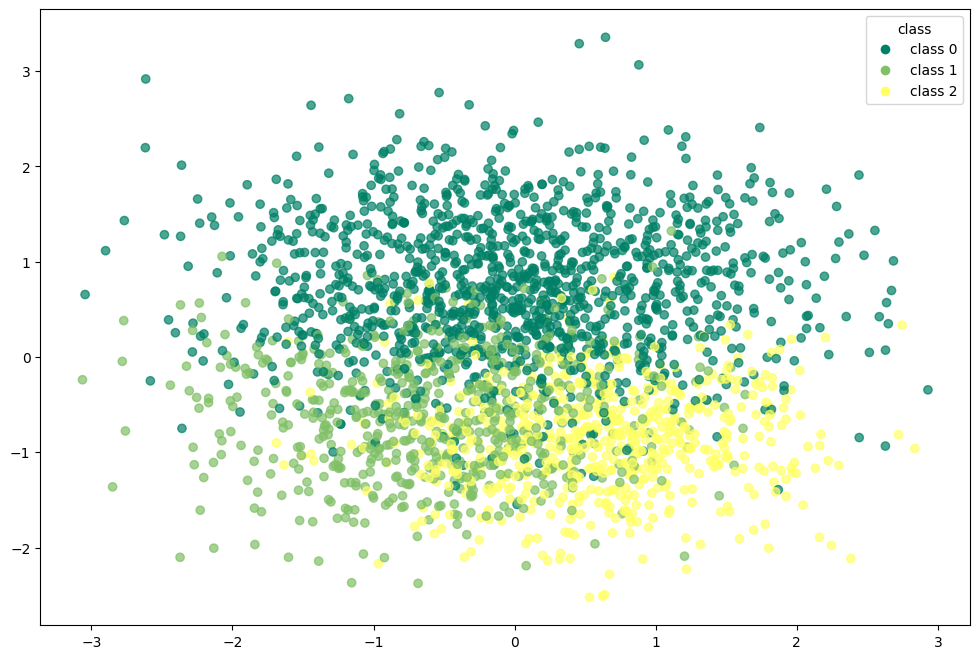

In [60]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

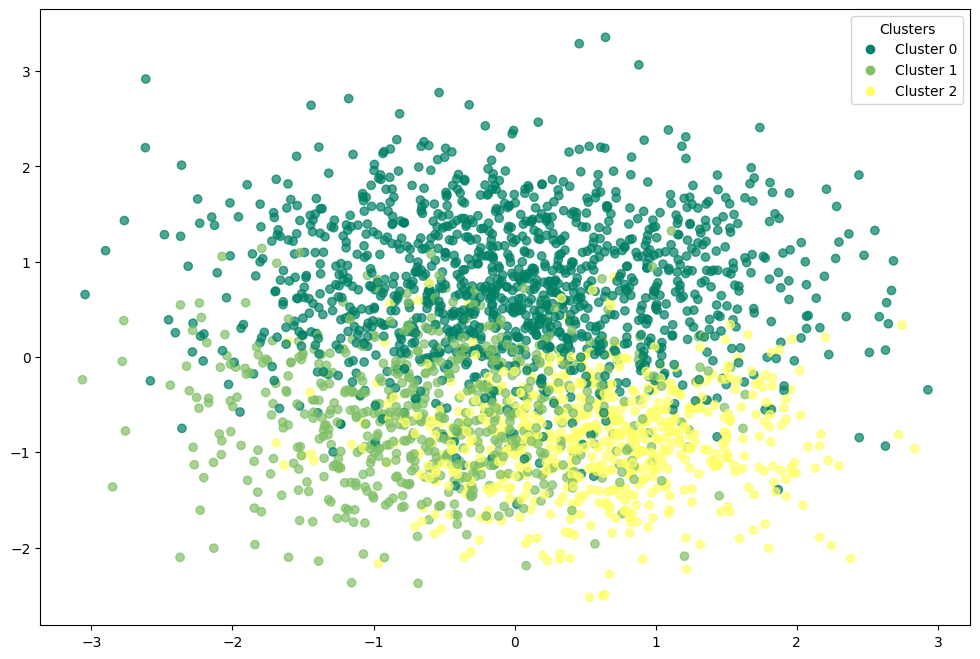

In [61]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [62]:
kmeans.cluster_centers_

array([[ 0.60005307, -0.86537953, -1.03360925,  0.82643474,  1.21953789,
         0.84193213,  0.53714394, -0.90472761,  0.36518042, -0.44440949,
        -0.21728193, -0.33451285, -1.12936615,  0.99642471,  0.29148457],
       [-0.59501524, -0.60272062,  0.03476222, -0.60520105, -0.21917827,
         0.41123199, -0.03328503, -0.51898194, -0.56237813, -0.32505622,
         1.18378925, -0.99624176, -0.07508858,  0.26284649, -0.36001109],
       [-0.00258423,  0.75308541,  0.51237453, -0.11348535, -0.51315044,
        -0.64283054, -0.25846247,  0.73031454,  0.10115571,  0.39470972,
        -0.49578536,  0.68263182,  0.61784428, -0.64596326,  0.03515177]])

In [63]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1233   15    2]
 [   1  616    8]
 [   0    2  623]]


In [64]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.97      0.99      0.98       625
           2       0.98      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [65]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.9686809290880649

In [66]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.9407295252106037

In [67]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.20993453968497347

### k-means with pca

In [68]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [69]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [70]:
df_pca_kmeans = X_pca.copy()

In [71]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [72]:
df_pca_kmeans['target'] = corr_dataset['target']

In [73]:
df_pca_kmeans

,dim_1,dim_2,kmeans_pca,target
0,3.302554,1.165642,1,0
1,1.760138,0.031350,1,0
2,-2.896813,-0.570498,0,2
3,0.779225,0.033066,1,0
4,2.486562,0.038089,1,0
...,...,...,...,...
2495,-2.297848,-1.418125,0,2
2496,-0.186148,1.385988,2,1
2497,-1.984767,-1.417433,0,2
2498,-1.298994,1.243779,2,1


In [74]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.0028
accuracy after: 0.9864


In [75]:
df_pca_kmeans

,dim_1,dim_2,kmeans_pca,target
0,3.302554,1.165642,0,0
1,1.760138,0.031350,0,0
2,-2.896813,-0.570498,2,2
3,0.779225,0.033066,0,0
4,2.486562,0.038089,0,0
...,...,...,...,...
2495,-2.297848,-1.418125,2,2
2496,-0.186148,1.385988,1,1
2497,-1.984767,-1.417433,2,2
2498,-1.298994,1.243779,1,1


In [76]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1229   18    3]
 [   0  616    9]
 [   0    4  621]]


In [77]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1250
           1       0.97      0.99      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.98      2500
weighted avg       0.99      0.99      0.99      2500



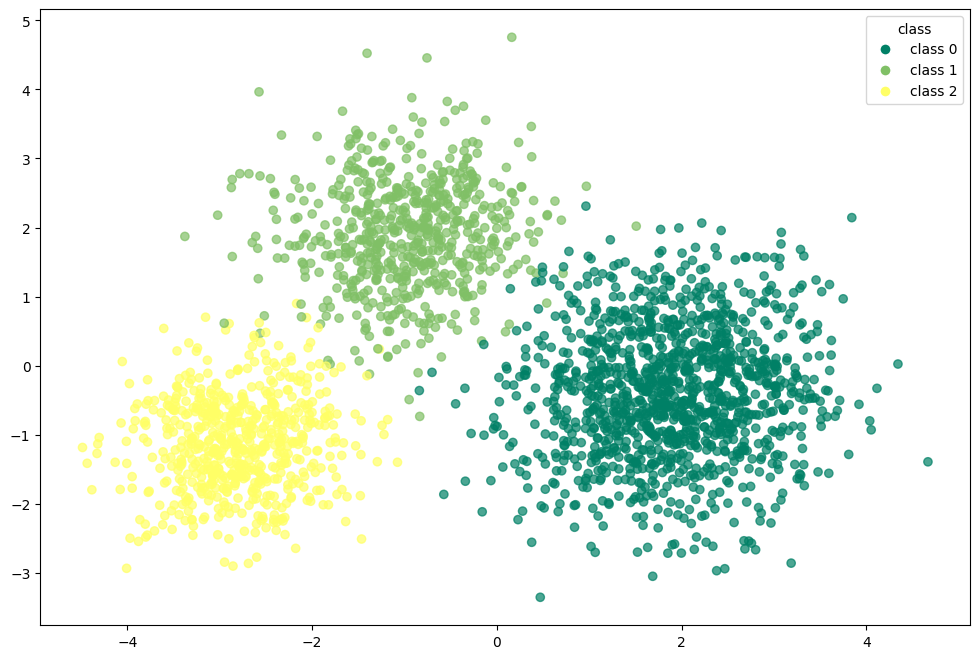

In [78]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

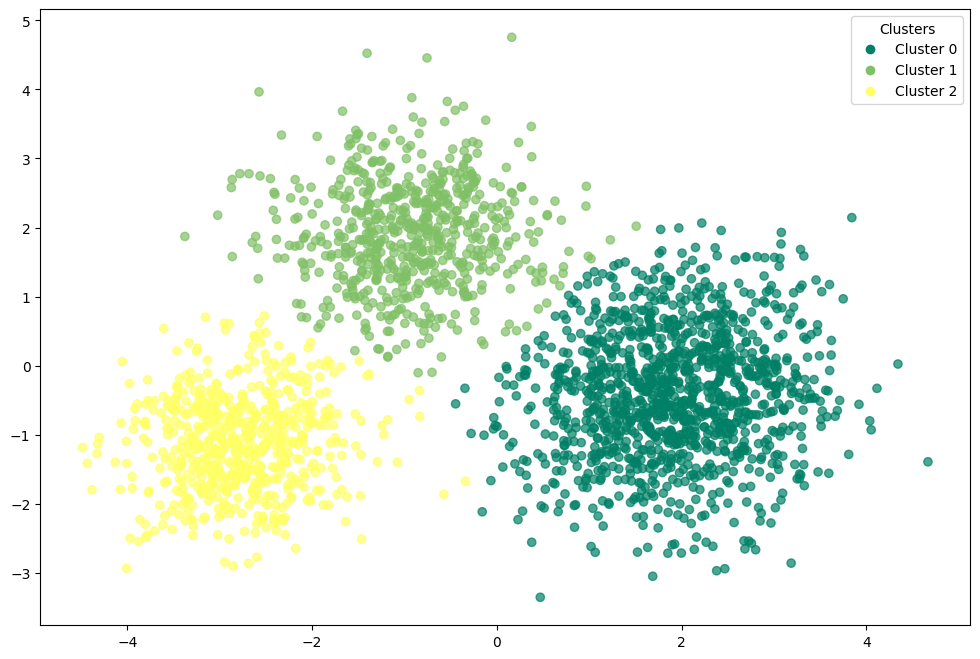

In [79]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [80]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.9623499842647022

In [81]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.9311521806756817

In [82]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.6064670474764573

### k-means with t-SNE

In [83]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [84]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [85]:
df_tsne_kmeans = X_tsne.copy()

In [86]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [87]:
df_tsne_kmeans['target'] = corr_dataset['target']

In [88]:
df_tsne_kmeans

,dim_1,dim_2,dim_3,kmeans_tsne,target
0,2.993417,1.466981,4.298259,2,0
1,18.101969,3.602019,-9.118330,2,0
2,-23.710184,-24.853226,-5.859434,0,2
3,31.015869,5.337931,-11.716872,2,0
4,8.539289,-23.890591,-4.554605,2,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,0,2
2496,-13.461441,2.161455,24.117638,1,1
2497,-31.398249,-9.028354,-15.616220,0,2
2498,-17.318478,12.477765,-6.362691,1,1


In [89]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.2404
accuracy after: 0.918


In [90]:
df_tsne_kmeans

,dim_1,dim_2,dim_3,kmeans_tsne,target
0,2.993417,1.466981,4.298259,0,0
1,18.101969,3.602019,-9.118330,0,0
2,-23.710184,-24.853226,-5.859434,2,2
3,31.015869,5.337931,-11.716872,0,0
4,8.539289,-23.890591,-4.554605,0,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,2,2
2496,-13.461441,2.161455,24.117638,1,1
2497,-31.398249,-9.028354,-15.616220,2,2
2498,-17.318478,12.477765,-6.362691,1,1


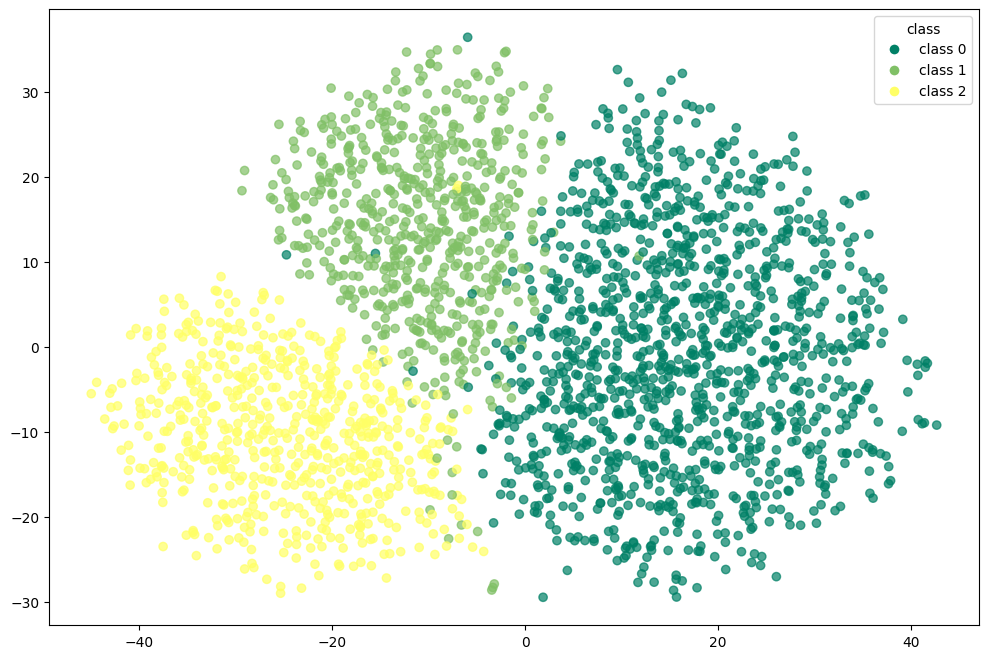

In [91]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

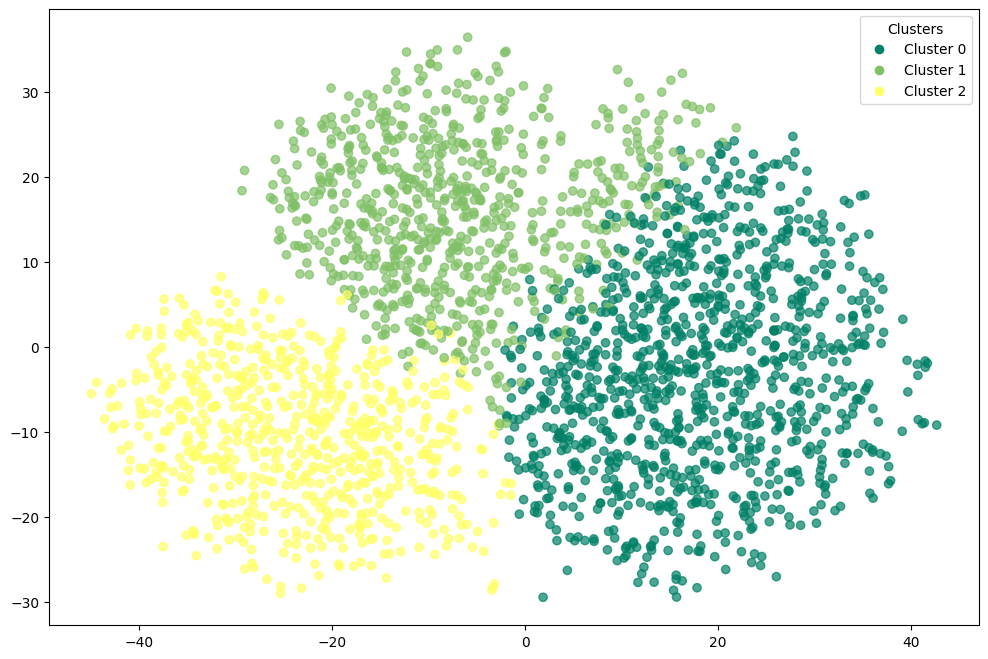

In [92]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [93]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1083  155   12]
 [   2  589   34]
 [   0    2  623]]


In [94]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.87      0.93      1250
           1       0.79      0.94      0.86       625
           2       0.93      1.00      0.96       625

    accuracy                           0.92      2500
   macro avg       0.91      0.94      0.92      2500
weighted avg       0.93      0.92      0.92      2500



In [95]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.7719089714211785

In [96]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.7548465873730449

In [97]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.3398624658584595

### k-means with umap

In [98]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [99]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [100]:
df_umap_kmeans = X_umap.copy()

In [101]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [102]:
df_umap_kmeans['target'] = corr_dataset['target']

In [103]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,target
0,11.330358,3.415561,4.021476,1,0
1,11.536426,2.995864,3.383035,1,0
2,0.527259,3.063997,3.603730,0,2
3,12.776800,2.446049,4.531347,1,0
4,11.153504,1.900840,3.846563,1,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,0,2
2496,5.286746,6.800919,4.354907,2,1
2497,1.027787,2.506734,4.103840,0,2
2498,6.608165,7.033211,4.317453,2,1


In [104]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.0016
accuracy after: 0.9904


In [105]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,target
0,11.330358,3.415561,4.021476,0,0
1,11.536426,2.995864,3.383035,0,0
2,0.527259,3.063997,3.603730,2,2
3,12.776800,2.446049,4.531347,0,0
4,11.153504,1.900840,3.846563,0,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,2,2
2496,5.286746,6.800919,4.354907,1,1
2497,1.027787,2.506734,4.103840,2,2
2498,6.608165,7.033211,4.317453,1,1


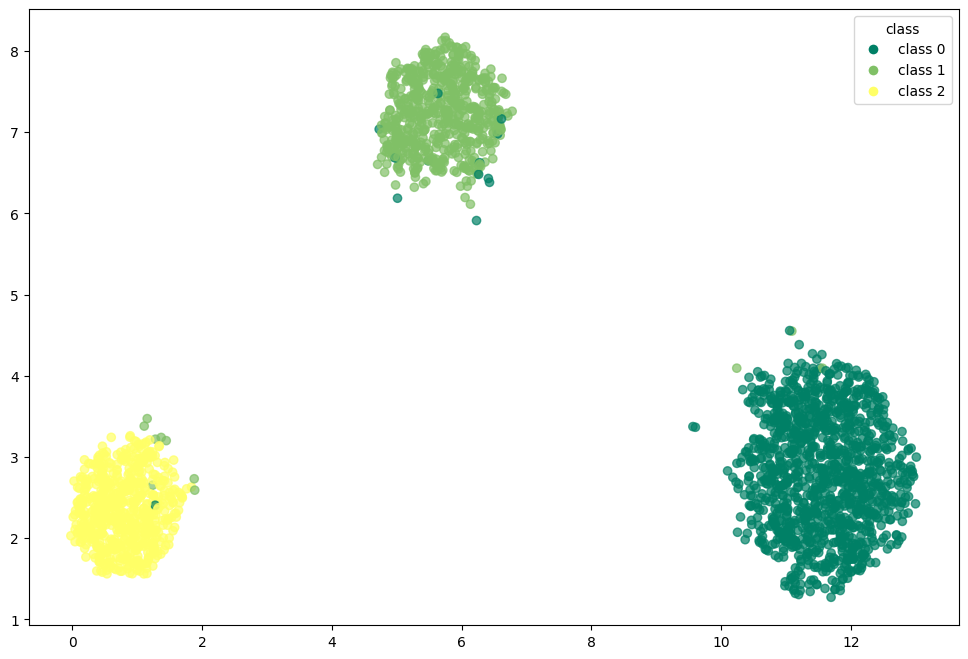

In [106]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

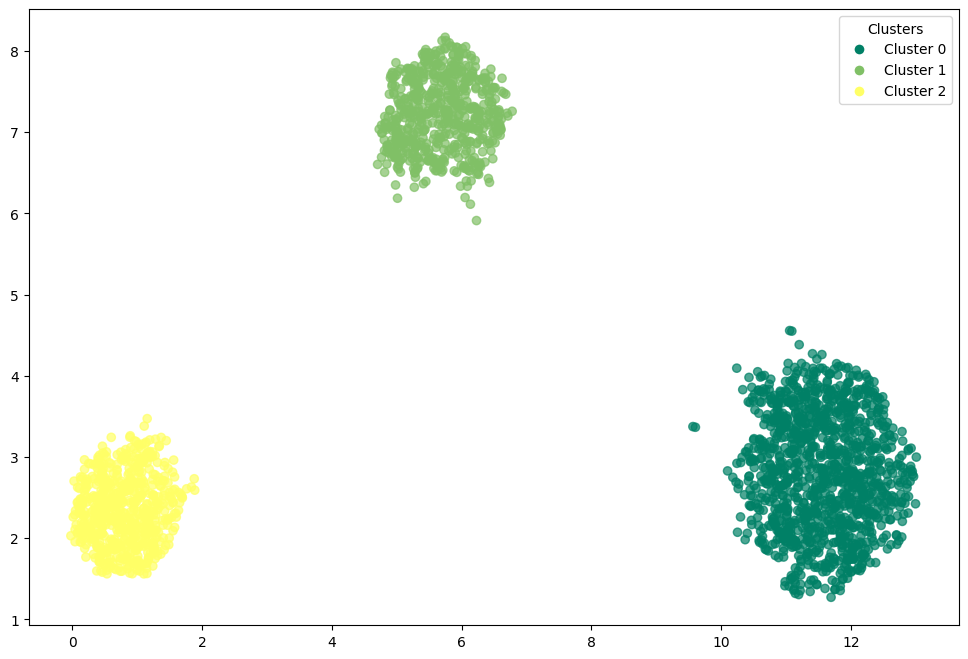

In [107]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [108]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


In [109]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [110]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9729314427440846

In [111]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9484428912497656

In [112]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.8242091536521912

## Birch - COMPRESSION BASED CLUSTERING ALGORITHM BASED

**BIRCH** is designed for **large-scale datasets**.  
It incrementally builds a **CF tree (Clustering Feature Tree)** — a compact hierarchical structure summarizing the data.  
Each node stores cluster statistics (count, linear sum, squared sum), which can later be reclustered globally.

1. **Build CF tree:** Insert data points, merging them into existing leaf nodes if within a threshold.  
2. **Optional condensing:** Prune or reorganize the tree to simplify its structure.  
3. **Global clustering:** Apply another algorithm (e.g., K-Means) on the CF leaf entries.  
4. **Refinement (optional):** Reassign original points based on the refined clusters.

**Strengths**
- Scales to very large datasets  
- Incremental and memory-efficient  
- Can be used as a preprocessing step  

**Weaknesses**
- Sensitive to threshold parameter  
- Works best with numeric data  
- May lose fine-grained cluster detail  

In [113]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [114]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [115]:
df_birch = X_values.copy()

In [116]:
df_birch['birch'] = birch.labels_

In [117]:
df_birch['target'] = corr_dataset['target']

In [118]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,birch,target
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,0,0
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,0,0
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,2,2
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,0,0
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,2,2
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,1,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,2,2
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,1,1


In [119]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.9804
accuracy after: 0.9804


In [120]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,birch,target
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,0,0
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,0,0
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,2,2
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,0,0
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,2,2
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,1,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,2,2
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,1,1


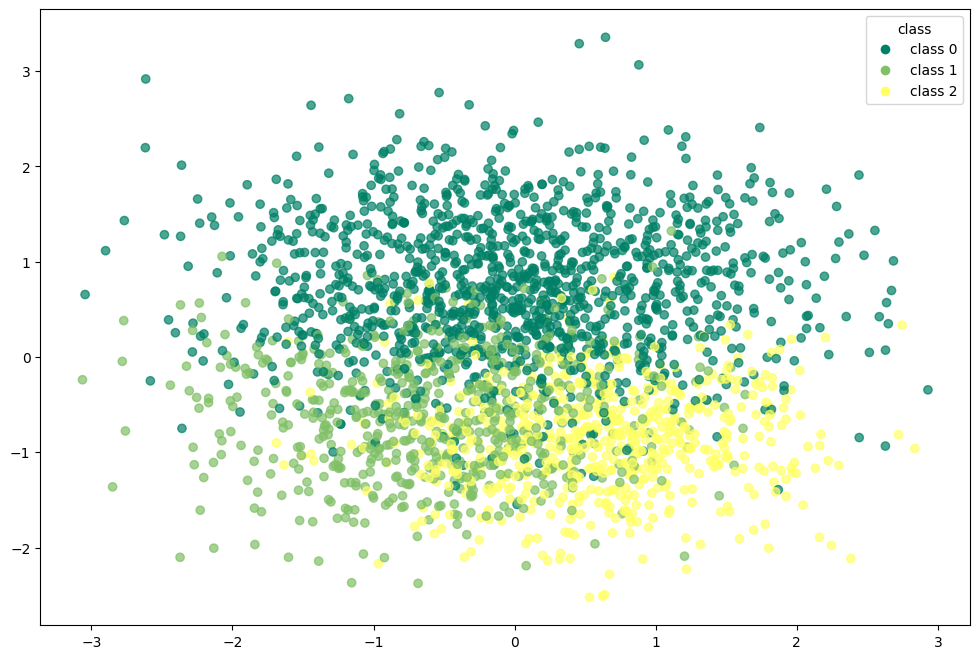

In [121]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

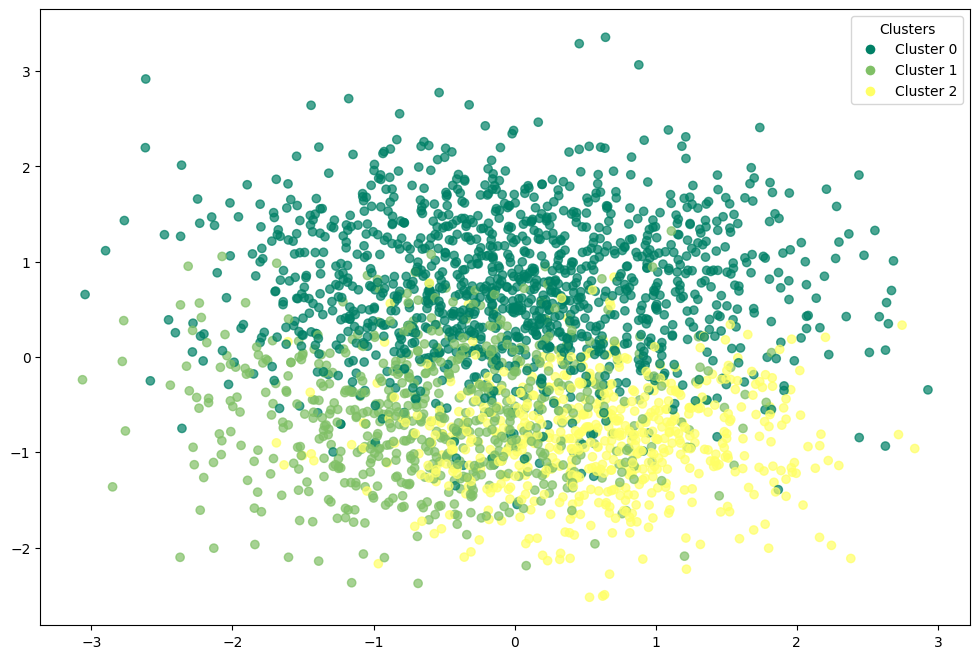

In [122]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [123]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[1228   21    1]
 [   8  614    3]
 [   0   16  609]]


In [124]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1250
           1       0.94      0.98      0.96       625
           2       0.99      0.97      0.98       625

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [125]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.9460419464417604

In [126]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.9053362046300261

In [127]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.2051172261306675

### Birch with pca

In [128]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [129]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [130]:
df_pca_birch = X_pca.copy()

In [131]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [132]:
df_pca_birch['target'] = corr_dataset['target']

In [133]:
df_pca_birch

,dim_1,dim_2,birch_pca,target
0,3.302554,1.165642,0,0
1,1.760138,0.031350,0,0
2,-2.896813,-0.570498,2,2
3,0.779225,0.033066,0,0
4,2.486562,0.038089,0,0
...,...,...,...,...
2495,-2.297848,-1.418125,2,2
2496,-0.186148,1.385988,1,1
2497,-1.984767,-1.417433,2,2
2498,-1.298994,1.243779,1,1


In [134]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.988
accuracy after: 0.988


In [135]:
df_pca_birch

,dim_1,dim_2,birch_pca,target
0,3.302554,1.165642,0,0
1,1.760138,0.031350,0,0
2,-2.896813,-0.570498,2,2
3,0.779225,0.033066,0,0
4,2.486562,0.038089,0,0
...,...,...,...,...
2495,-2.297848,-1.418125,2,2
2496,-0.186148,1.385988,1,1
2497,-1.984767,-1.417433,2,2
2498,-1.298994,1.243779,1,1


In [136]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[1236   12    2]
 [   3  613    9]
 [   0    4  621]]


In [137]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.97      0.98      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [138]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.9674401278690483

In [139]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.9350589127841082

In [140]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.6068307541113243

### Birch with t-SNE

In [141]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [142]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [143]:
df_tsne_birch = X_tsne.copy()

In [144]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [145]:
df_tsne_birch['target'] = corr_dataset['target']

In [146]:
df_tsne_birch

,dim_1,dim_2,dim_3,birch_tsne,target
0,2.993417,1.466981,4.298259,0,0
1,18.101969,3.602019,-9.118330,0,0
2,-23.710184,-24.853226,-5.859434,2,2
3,31.015869,5.337931,-11.716872,0,0
4,8.539289,-23.890591,-4.554605,0,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,2,2
2496,-13.461441,2.161455,24.117638,1,1
2497,-31.398249,-9.028354,-15.616220,2,2
2498,-17.318478,12.477765,-6.362691,1,1


In [147]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.9592
accuracy after: 0.9592


In [148]:
df_tsne_birch

,dim_1,dim_2,dim_3,birch_tsne,target
0,2.993417,1.466981,4.298259,0,0
1,18.101969,3.602019,-9.118330,0,0
2,-23.710184,-24.853226,-5.859434,2,2
3,31.015869,5.337931,-11.716872,0,0
4,8.539289,-23.890591,-4.554605,0,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,2,2
2496,-13.461441,2.161455,24.117638,1,1
2497,-31.398249,-9.028354,-15.616220,2,2
2498,-17.318478,12.477765,-6.362691,1,1


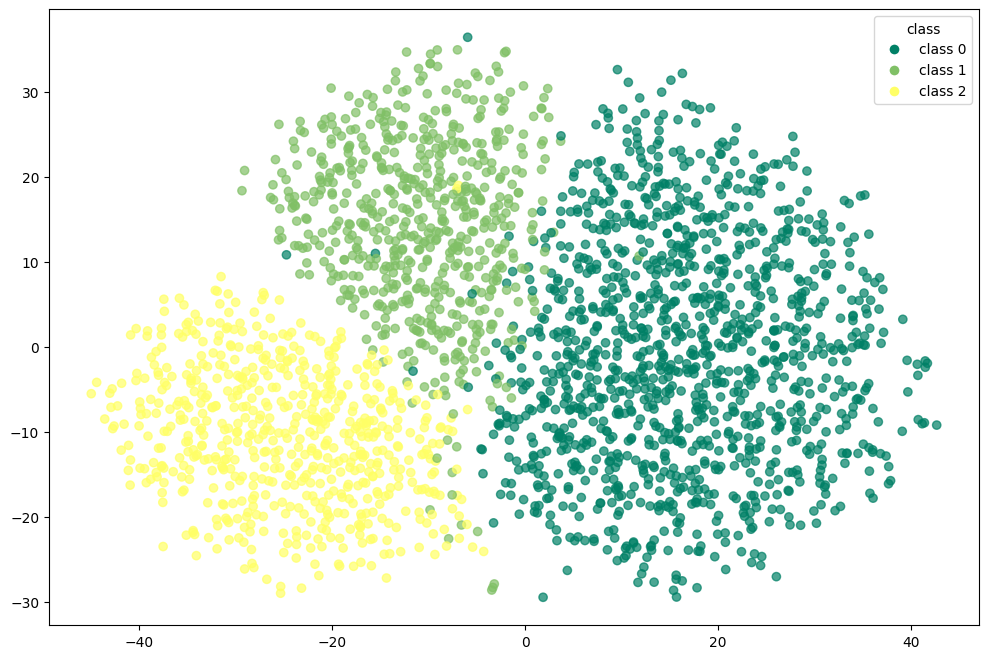

In [149]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

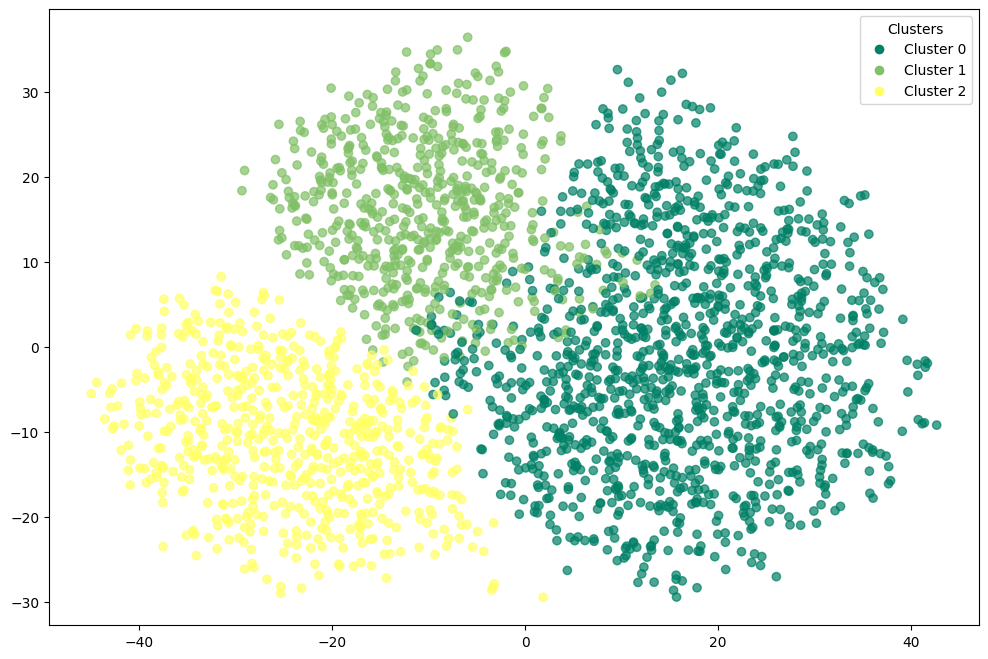

In [150]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [151]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[1209   38    3]
 [  45  566   14]
 [   0    2  623]]


In [152]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1250
           1       0.93      0.91      0.92       625
           2       0.97      1.00      0.98       625

    accuracy                           0.96      2500
   macro avg       0.96      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [153]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.8820765255035401

In [154]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.8329363458640973

In [155]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.3270229697227478

### Birch with umap

In [156]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [157]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [158]:
df_umap_birch = X_umap.copy()

In [159]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [160]:
df_umap_birch['target'] = corr_dataset['target']

In [161]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap,target
0,11.330358,3.415561,4.021476,1,0
1,11.536426,2.995864,3.383035,1,0
2,0.527259,3.063997,3.603730,2,2
3,12.776800,2.446049,4.531347,1,0
4,11.153504,1.900840,3.846563,1,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,2,2
2496,5.286746,6.800919,4.354907,0,1
2497,1.027787,2.506734,4.103840,2,2
2498,6.608165,7.033211,4.317453,0,1


In [162]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.256
accuracy after: 0.9904


In [163]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap,target
0,11.330358,3.415561,4.021476,0,0
1,11.536426,2.995864,3.383035,0,0
2,0.527259,3.063997,3.603730,2,2
3,12.776800,2.446049,4.531347,0,0
4,11.153504,1.900840,3.846563,0,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,2,2
2496,5.286746,6.800919,4.354907,1,1
2497,1.027787,2.506734,4.103840,2,2
2498,6.608165,7.033211,4.317453,1,1


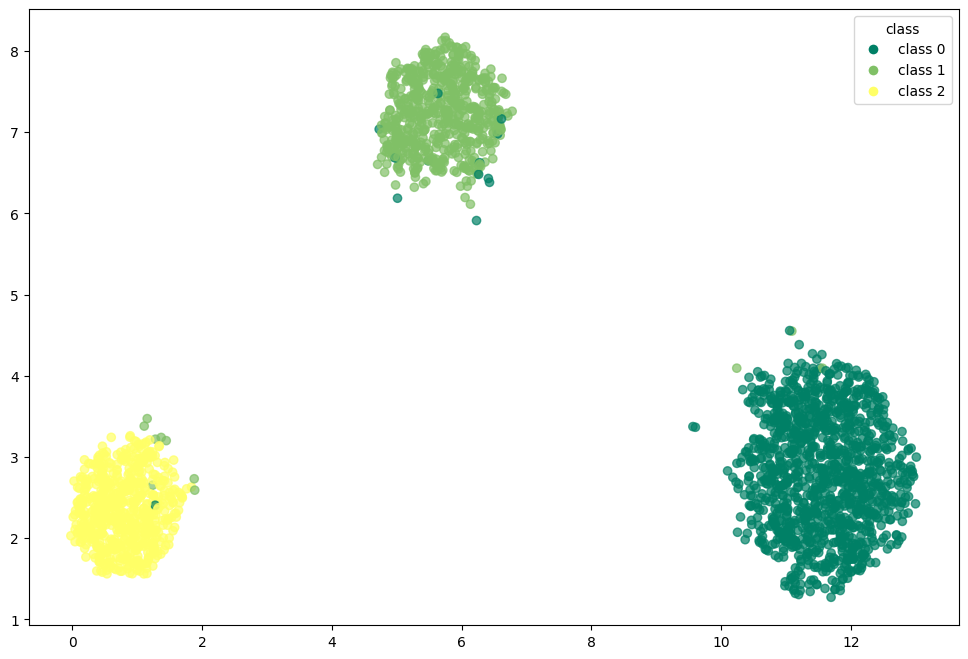

In [164]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

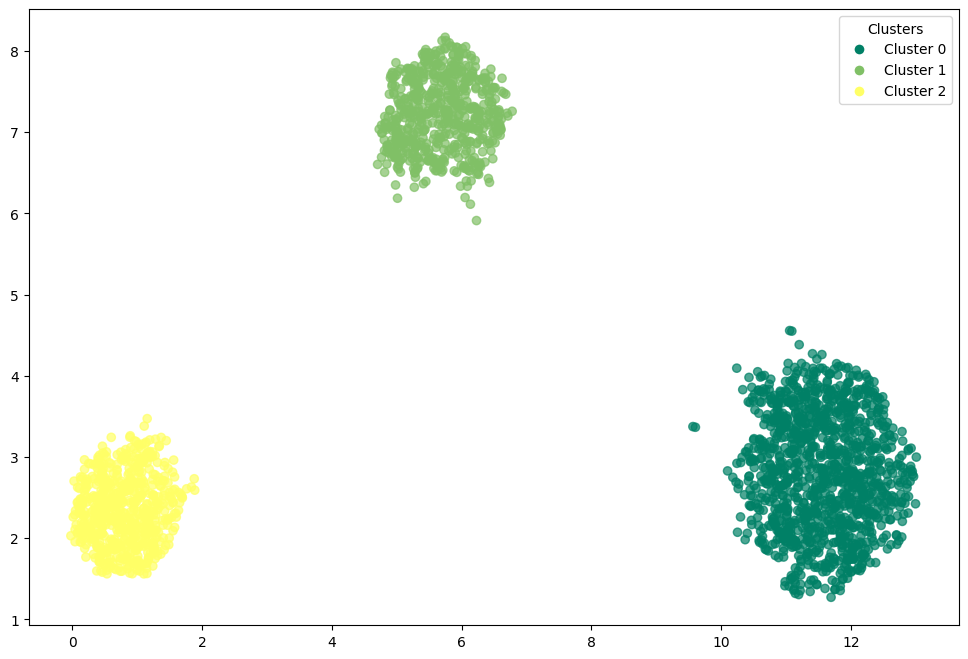

In [165]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [166]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


In [167]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [168]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9729314427440846

In [169]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9484428912497656

In [170]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.8242091536521912

## GMM, Gaussian Mixture Models - DISTRIBUTION BASED CLUSTERING ALGORITHM TYPE

**Gaussian Mixture Models (GMM)** take a **probabilistic approach** to clustering.  
They assume the data is generated by a mixture of several Gaussian distributions, each defined by its mean, covariance, and weight.

1. **Expectation (E-step):** Compute the probability that each point belongs to each Gaussian component.  
2. **Maximization (M-step):** Update parameters (means, covariances, weights) based on these probabilities.  
3. Repeat until the likelihood converges.

Unlike K-Means, GMM performs **soft clustering** — each point has a probability of belonging to multiple clusters.  
This allows for **elliptical** clusters of different sizes and orientations.

**Strengths**
- Flexible: handles elliptical clusters  
- Provides probabilistic cluster memberships  
- Can model varying cluster sizes  

**Weaknesses**
- Sensitive to initialization  
- Computationally heavier than K-Means  
- Requires choosing number of components 

In [171]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [172]:
gmm.fit(X_values)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [173]:
df_gmm = X_values.copy()

In [174]:
df_gmm['gmm'] = gmm.predict(X_values)

In [175]:
df_gmm['target'] = corr_dataset['target']

In [176]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,gmm,target
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,2,0
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,2,0
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,0,2
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,2,0
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,0,2
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,1,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,0,2
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,1,1


In [177]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.2488
accuracy after: 0.9952


In [178]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,gmm,target
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,0,0
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,0,0
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,2,2
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,0,0
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,2,2
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,1,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,2,2
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,1,1


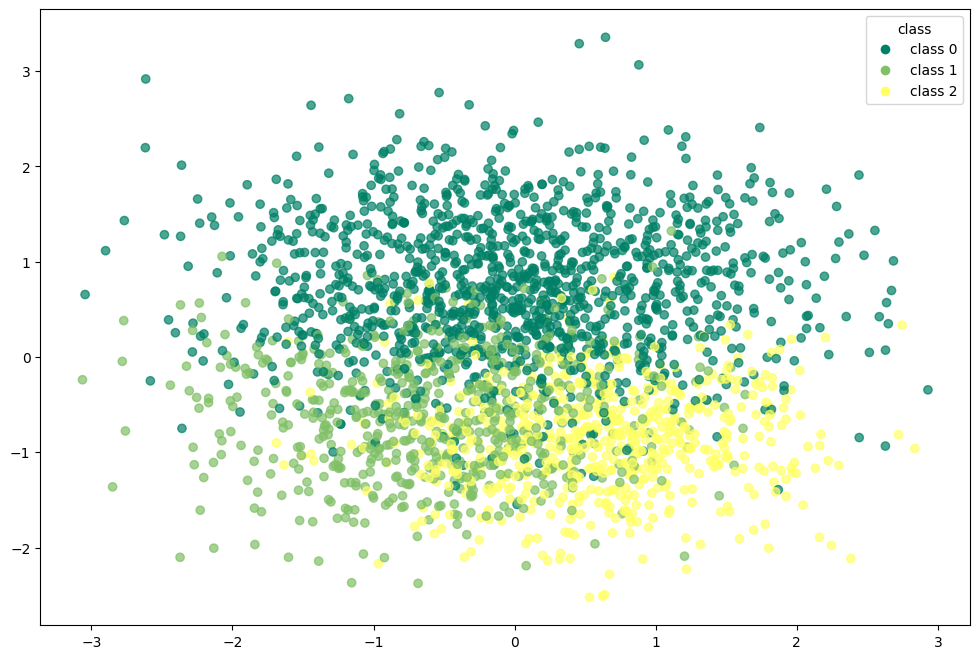

In [179]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

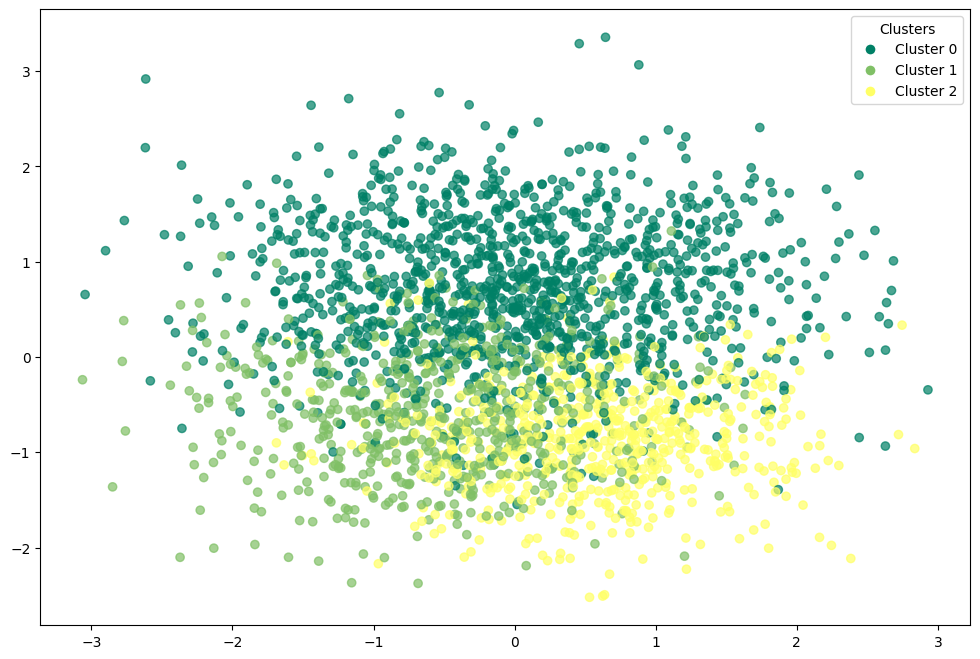

In [180]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [181]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1241    9    0]
 [   1  622    2]
 [   0    0  625]]


In [182]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1250
           1       0.99      1.00      0.99       625
           2       1.00      1.00      1.00       625

    accuracy                           1.00      2500
   macro avg       0.99      1.00      0.99      2500
weighted avg       1.00      1.00      1.00      2500



In [183]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.9855561292434829

In [184]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.9725037383492772

In [185]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.20965413047589646

### GMM with pca

In [186]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [187]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [188]:
df_pca_gmm = X_pca.copy()

In [189]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [190]:
df_pca_gmm['target'] = corr_dataset['target']

In [191]:
df_pca_gmm

,dim_1,dim_2,gmm_pca,target
0,3.302554,1.165642,1,0
1,1.760138,0.031350,1,0
2,-2.896813,-0.570498,0,2
3,0.779225,0.033066,1,0
4,2.486562,0.038089,1,0
...,...,...,...,...
2495,-2.297848,-1.418125,0,2
2496,-0.186148,1.385988,2,1
2497,-1.984767,-1.417433,0,2
2498,-1.298994,1.243779,2,1


In [192]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.0032
accuracy after: 0.99


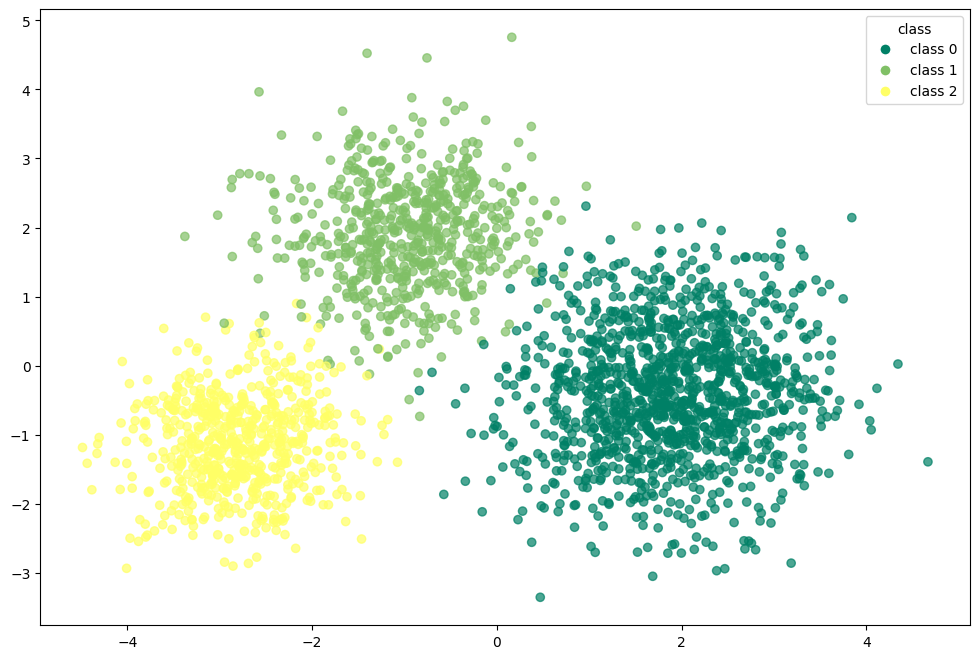

In [193]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

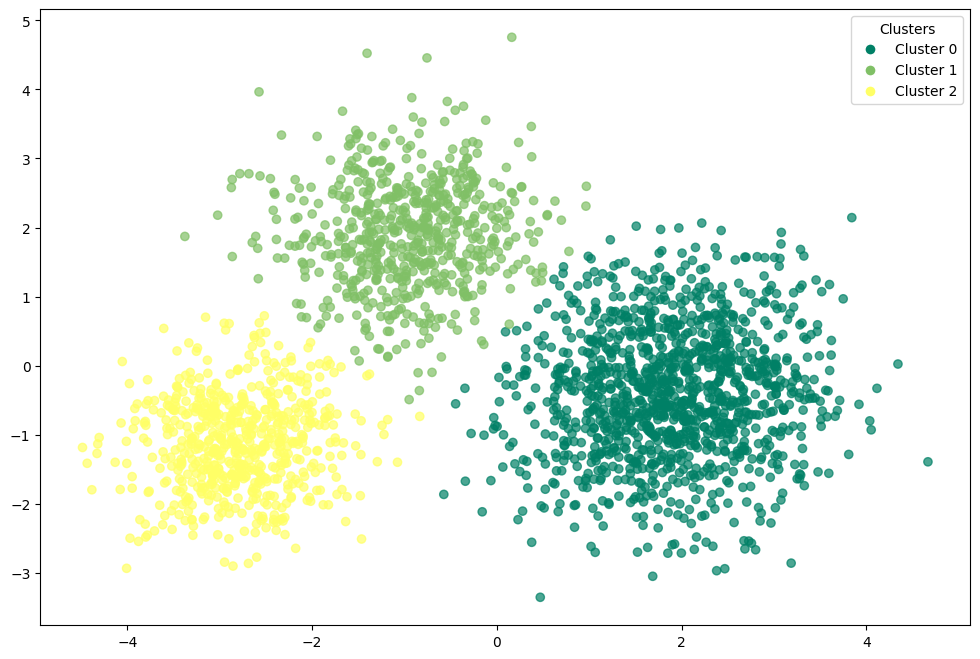

In [194]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [195]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1240   10    0]
 [   4  614    7]
 [   0    4  621]]


In [196]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [197]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.972924961067714

In [198]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.9450587560339307

In [199]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.6062120011173199

### GMM with t-SNE

In [200]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [201]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [202]:
df_tsne_gmm = X_tsne.copy()

In [203]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [204]:
df_tsne_gmm['target'] = corr_dataset['target']

In [205]:
df_tsne_gmm

,dim_1,dim_2,dim_3,gmm_tsne,target
0,2.993417,1.466981,4.298259,1,0
1,18.101969,3.602019,-9.118330,2,0
2,-23.710184,-24.853226,-5.859434,0,2
3,31.015869,5.337931,-11.716872,2,0
4,8.539289,-23.890591,-4.554605,2,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,0,2
2496,-13.461441,2.161455,24.117638,1,1
2497,-31.398249,-9.028354,-15.616220,0,2
2498,-17.318478,12.477765,-6.362691,1,1


In [206]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.238
accuracy after: 0.9008


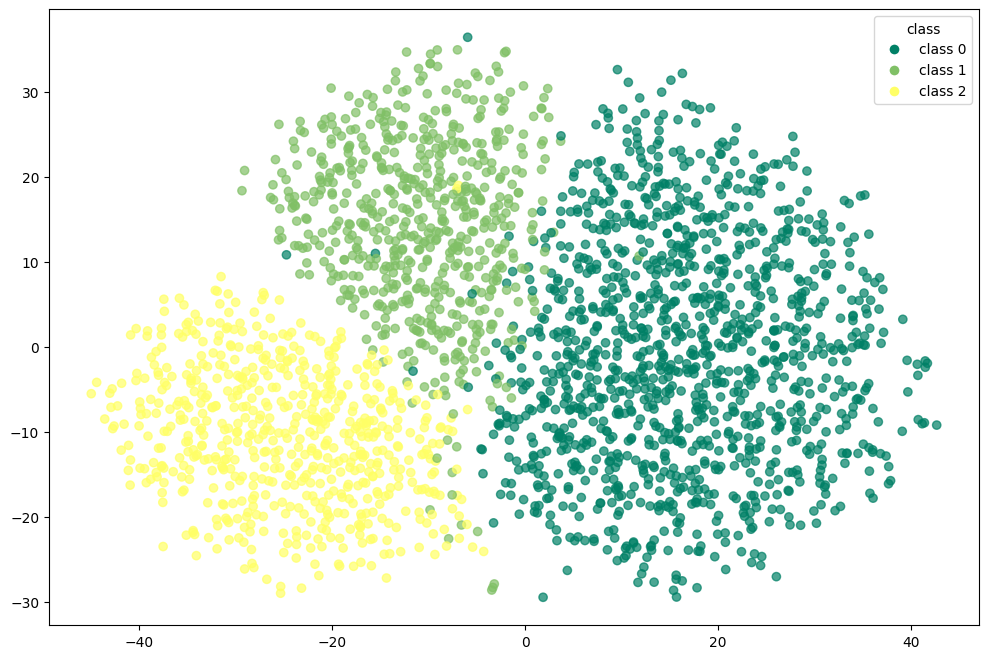

In [207]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

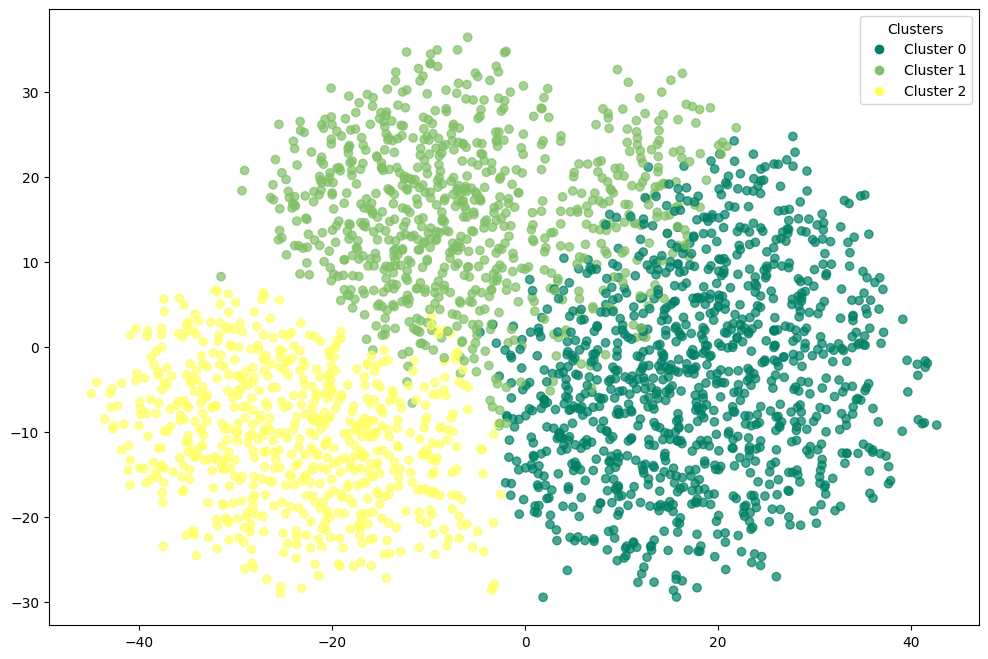

In [208]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [209]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1044  197    9]
 [   5  586   34]
 [   0    3  622]]


In [210]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.84      0.91      1250
           1       0.75      0.94      0.83       625
           2       0.94      1.00      0.96       625

    accuracy                           0.90      2500
   macro avg       0.89      0.92      0.90      2500
weighted avg       0.92      0.90      0.90      2500



In [211]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.7280944860487211

In [212]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.7262863216498758

In [213]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.3381272852420807

### GMM with umap

In [214]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [215]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [216]:
df_umap_gmm = X_umap.copy()

In [217]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [218]:
df_umap_gmm['target'] = corr_dataset['target']

In [219]:
df_umap_gmm

,dim_1,dim_2,dim_3,gmm_umap,target
0,11.330358,3.415561,4.021476,1,0
1,11.536426,2.995864,3.383035,1,0
2,0.527259,3.063997,3.603730,0,2
3,12.776800,2.446049,4.531347,1,0
4,11.153504,1.900840,3.846563,1,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,0,2
2496,5.286746,6.800919,4.354907,2,1
2497,1.027787,2.506734,4.103840,0,2
2498,6.608165,7.033211,4.317453,2,1


In [220]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.0016
accuracy after: 0.9904


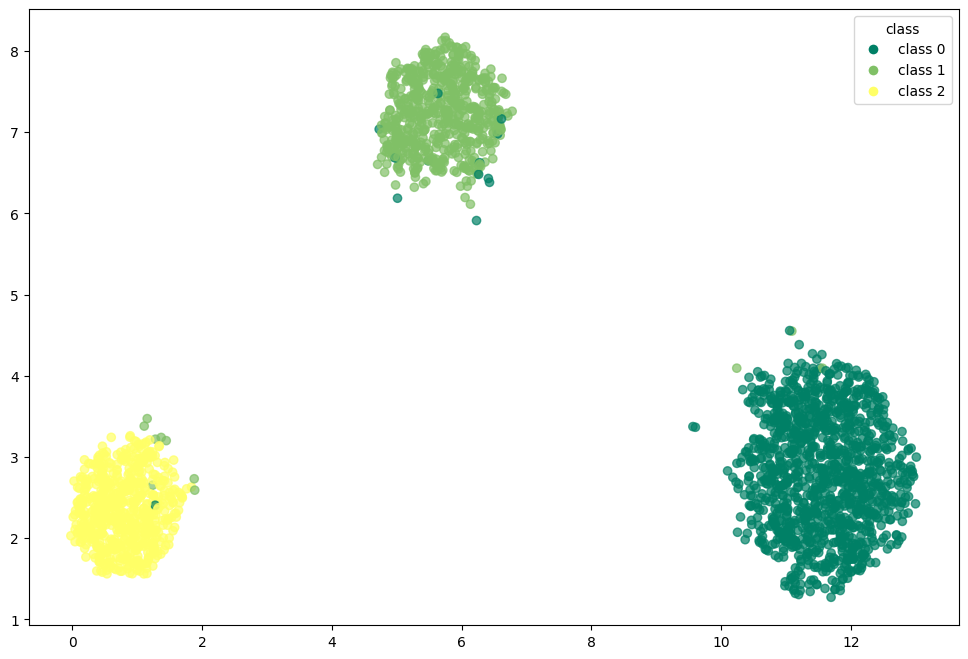

In [221]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

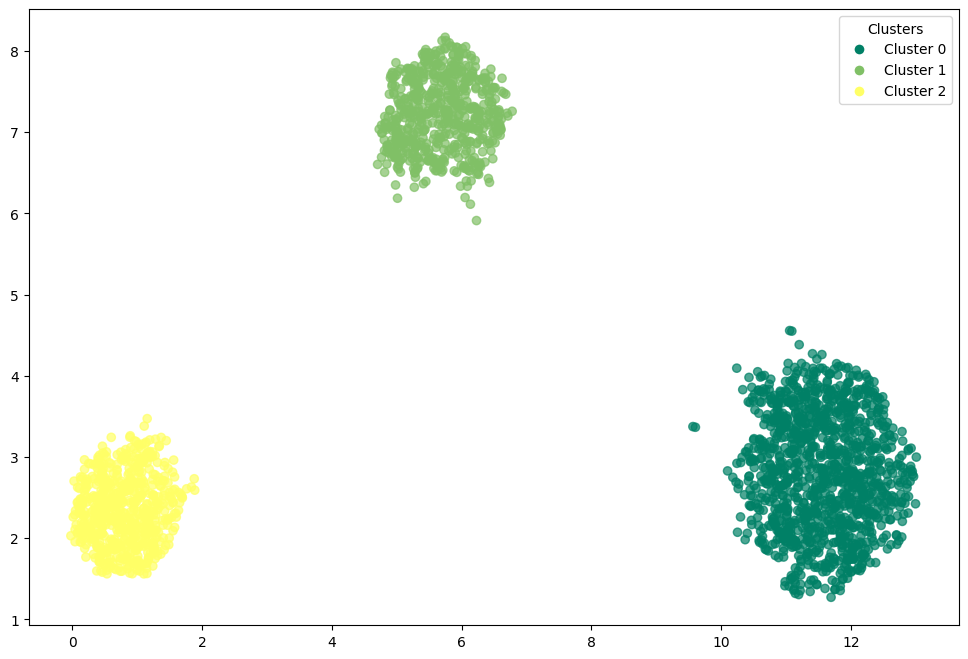

In [222]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [223]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


In [224]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [225]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9729314427440846

In [226]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9484428912497656

In [227]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.8242091536521912

## pam - MEDOIDS BASED CLUSTERING ALGORITHM TYPE

**PAM** is similar to K-Means but uses **medoids** (actual data points) instead of centroids.  
It minimizes the sum of dissimilarities between points and their cluster medoid.

1. **BUILD phase:** Select initial `k` medoids.  
2. **SWAP phase:** Iteratively swap medoids with non-medoids if it reduces the total clustering cost.  
3. Stop when no further improvement is possible.

PAM is more robust to **outliers** since medoids are real observations and not averages.

**Strengths**
- Robust to outliers  
- Works with any distance metric  
- Hard clustering, interpretable medoids  

**Weaknesses**
- Computationally expensive (slow on large data)  
- Not ideal for high-dimensional datasets  
- Still requires `k` to be predefined  

In [228]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [229]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [230]:
pam = kmedoids(X_values.values.tolist(),initial_medoids,metric=metric)

In [231]:
pam.process()

In [232]:
clusters = pam.get_clusters()

In [233]:
medoids = pam.get_medoids()

In [234]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [235]:
df_pam = corr_dataset.copy()

In [236]:
df_pam['pam'] = labels

In [237]:
df_pam['target'] = corr_dataset['target']

In [238]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-18.983480,5.229644,13.239476,-4.550903,-11.528850,-7.800392,-20.640116,2.974633,0.145473,0.130923,-14.217713,11.321875,9.026927,-19.175123,-3.828869,0,2.0
1,-3.179723,9.511591,9.027860,0.822728,-4.266822,1.897993,-10.929225,14.353903,2.537269,5.451601,-8.787611,5.543291,-0.024904,-8.389655,-12.125465,0,2.0
2,0.385977,-3.459267,-9.586631,13.444852,12.674247,9.168435,-9.870956,-15.329741,-6.233079,5.591115,4.315062,1.159432,-6.251279,6.475107,3.749874,2,0.0
3,-6.809685,0.986948,-3.500418,7.331891,-1.787552,-13.683055,-19.115151,7.833995,6.830186,0.723469,2.970847,-3.950488,1.509960,-9.483745,2.536992,0,2.0
4,-9.365060,17.013646,2.007627,-9.455772,-12.943109,-6.484030,6.352996,6.314788,1.380163,6.821738,-17.199345,5.772966,6.597403,-12.188649,-5.450524,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,11.062640,2.572850,-3.959072,5.298091,3.486591,7.963619,-3.017656,-5.903721,6.432101,-6.187759,-4.967413,2.773594,-14.998758,4.857817,-5.611367,2,0.0
2496,-5.668247,7.378077,-7.812842,-9.995360,-4.617840,-6.371730,-3.633050,4.629380,-4.146236,6.202074,0.339437,-4.402179,-12.325840,1.572455,-12.020643,1,1.0
2497,5.089639,-7.483247,0.598959,16.073111,4.036316,10.353236,-8.497486,1.904544,2.723340,0.254226,-3.276866,5.426045,-13.631549,3.963593,-3.619724,2,0.0
2498,-4.659841,-12.214659,-2.311693,3.737117,2.980152,-7.417740,-13.318775,-12.523005,9.072837,-1.663304,9.653037,-7.281745,6.193220,-2.232408,-9.195109,1,1.0


In [239]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.252
accuracy after: 0.934


In [240]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-18.983480,5.229644,13.239476,-4.550903,-11.528850,-7.800392,-20.640116,2.974633,0.145473,0.130923,-14.217713,11.321875,9.026927,-19.175123,-3.828869,0,0
1,-3.179723,9.511591,9.027860,0.822728,-4.266822,1.897993,-10.929225,14.353903,2.537269,5.451601,-8.787611,5.543291,-0.024904,-8.389655,-12.125465,0,0
2,0.385977,-3.459267,-9.586631,13.444852,12.674247,9.168435,-9.870956,-15.329741,-6.233079,5.591115,4.315062,1.159432,-6.251279,6.475107,3.749874,2,2
3,-6.809685,0.986948,-3.500418,7.331891,-1.787552,-13.683055,-19.115151,7.833995,6.830186,0.723469,2.970847,-3.950488,1.509960,-9.483745,2.536992,0,0
4,-9.365060,17.013646,2.007627,-9.455772,-12.943109,-6.484030,6.352996,6.314788,1.380163,6.821738,-17.199345,5.772966,6.597403,-12.188649,-5.450524,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,11.062640,2.572850,-3.959072,5.298091,3.486591,7.963619,-3.017656,-5.903721,6.432101,-6.187759,-4.967413,2.773594,-14.998758,4.857817,-5.611367,2,2
2496,-5.668247,7.378077,-7.812842,-9.995360,-4.617840,-6.371730,-3.633050,4.629380,-4.146236,6.202074,0.339437,-4.402179,-12.325840,1.572455,-12.020643,1,1
2497,5.089639,-7.483247,0.598959,16.073111,4.036316,10.353236,-8.497486,1.904544,2.723340,0.254226,-3.276866,5.426045,-13.631549,3.963593,-3.619724,2,2
2498,-4.659841,-12.214659,-2.311693,3.737117,2.980152,-7.417740,-13.318775,-12.523005,9.072837,-1.663304,9.653037,-7.281745,6.193220,-2.232408,-9.195109,1,1


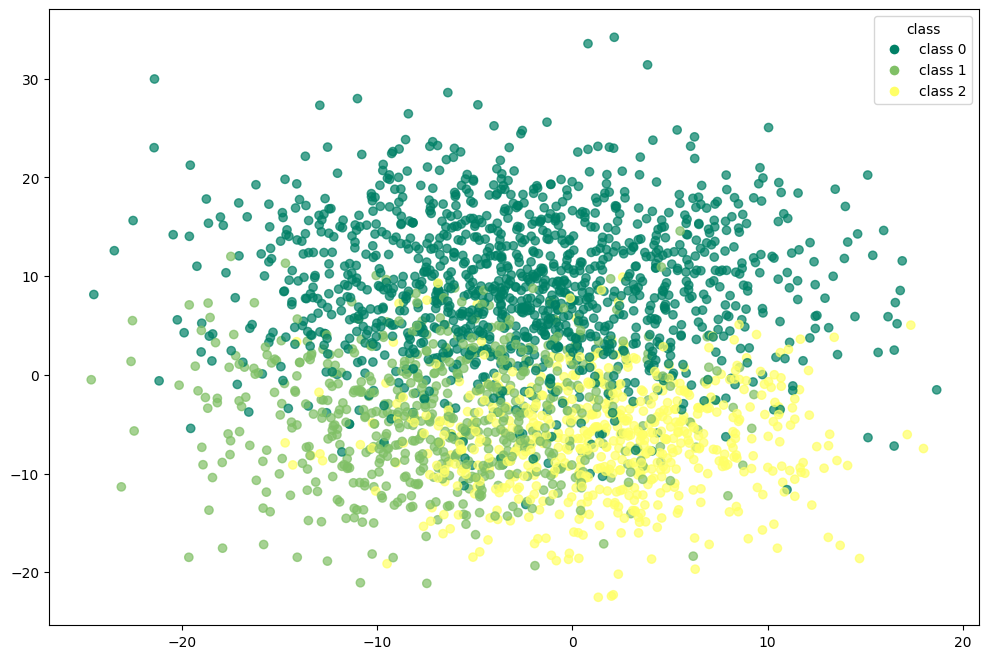

In [241]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

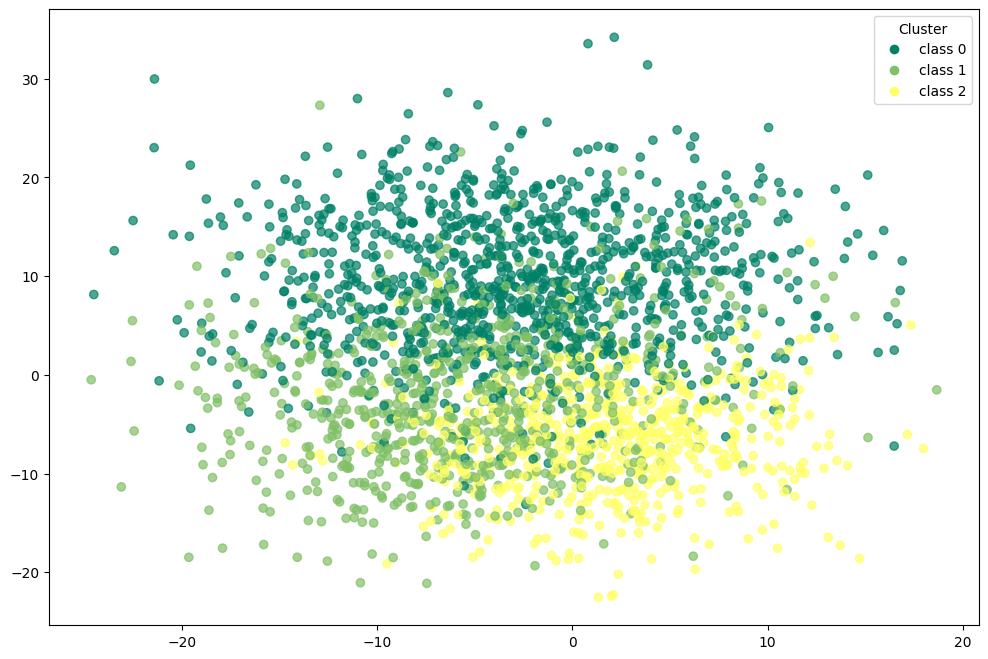

In [242]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [243]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1095  147    8]
 [   0  622    3]
 [   0    7  618]]


In [244]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      0.88      0.93      1250
           1       0.80      1.00      0.89       625
           2       0.98      0.99      0.99       625

    accuracy                           0.93      2500
   macro avg       0.93      0.95      0.94      2500
weighted avg       0.95      0.93      0.94      2500



In [245]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.8057845067223118

In [246]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.804053273784713

In [247]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.21513828430336443

### pam with pca

In [248]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [249]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [250]:
pam_pca = kmedoids(X_pca.values.tolist(),initial_medoids,metric=metric)

In [251]:
pam_pca.process()

In [252]:
clusters = pam_pca.get_clusters()

In [253]:
medoids = pam_pca.get_medoids()

In [254]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [255]:
df_pam_pca = X_pca.copy()

In [256]:
df_pam_pca['pam_pca'] = labels

In [257]:
df_pam_pca['target'] = corr_dataset['target']

In [258]:
df_pam_pca

,dim_1,dim_2,pam_pca,target
0,3.302554,1.165642,2.0,0
1,1.760138,0.031350,2.0,0
2,-2.896813,-0.570498,1.0,2
3,0.779225,0.033066,2.0,0
4,2.486562,0.038089,2.0,0
...,...,...,...,...
2495,-2.297848,-1.418125,1.0,2
2496,-0.186148,1.385988,0.0,1
2497,-1.984767,-1.417433,1.0,2
2498,-1.298994,1.243779,0.0,1


In [259]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.0108
accuracy after: 0.9864


In [260]:
df_pam_pca

,dim_1,dim_2,pam_pca,target
0,3.302554,1.165642,0,0
1,1.760138,0.031350,0,0
2,-2.896813,-0.570498,2,2
3,0.779225,0.033066,0,0
4,2.486562,0.038089,0,0
...,...,...,...,...
2495,-2.297848,-1.418125,2,2
2496,-0.186148,1.385988,1,1
2497,-1.984767,-1.417433,2,2
2498,-1.298994,1.243779,1,1


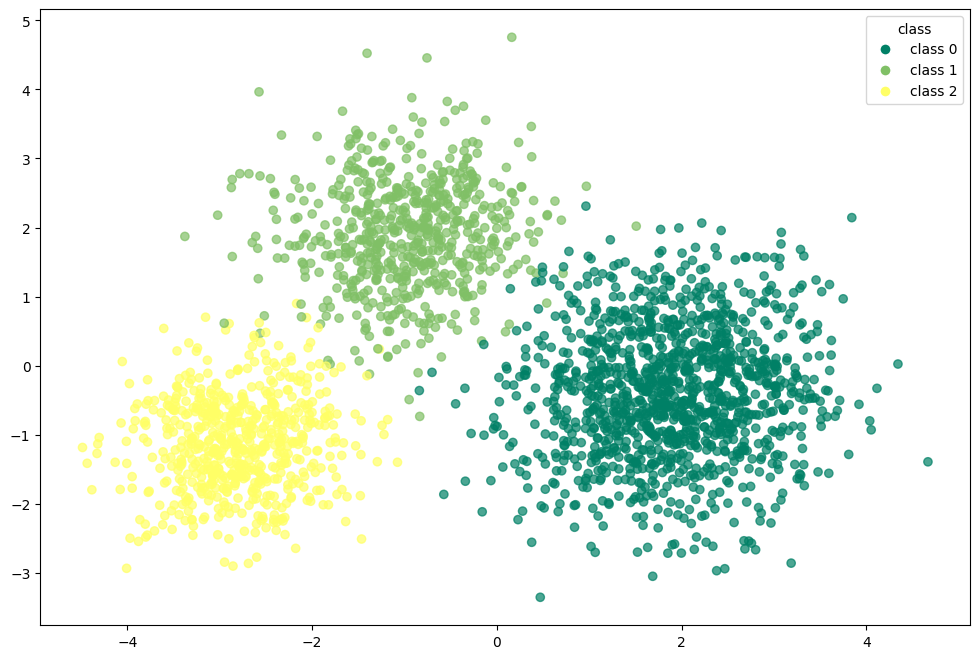

In [261]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

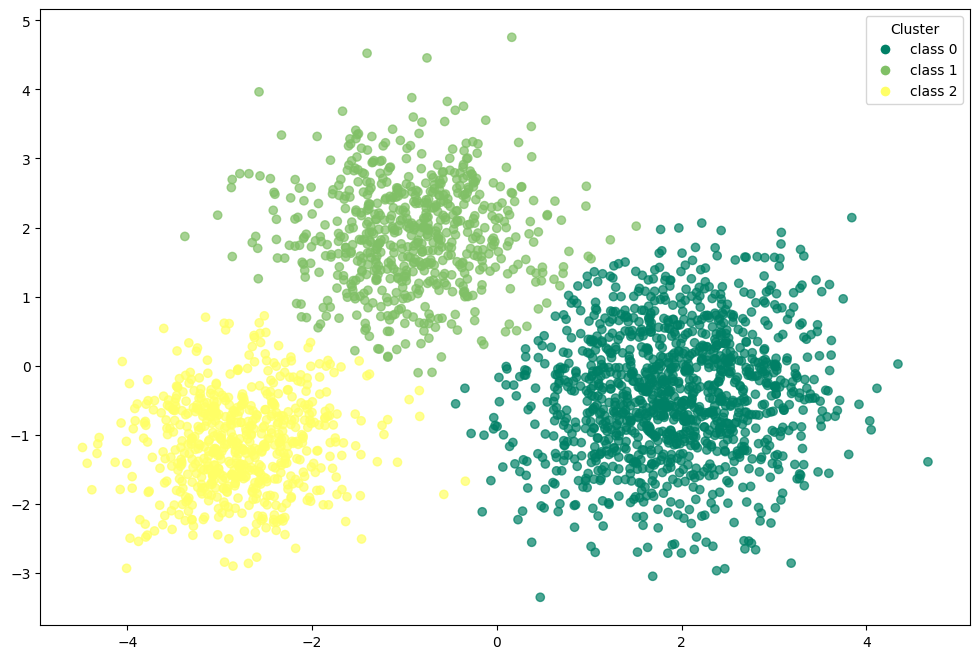

In [262]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [263]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1229   18    3]
 [   0  616    9]
 [   0    4  621]]


In [264]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1250
           1       0.97      0.99      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.98      2500
weighted avg       0.99      0.99      0.99      2500



In [265]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.9623499842647022

In [266]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.9311521806756817

In [267]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.6064670474764573

### pam with t-SNE

In [268]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [269]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [270]:
pam_tsne = kmedoids(X_tsne.values.tolist(),initial_medoids,metric=metric)

In [271]:
pam_tsne.process()

In [272]:
clusters = pam_tsne.get_clusters()

In [273]:
medoids = pam_tsne.get_medoids()

In [274]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [275]:
df_pam_tsne = X_tsne.copy()

In [276]:
df_pam_tsne['pam_tsne'] = labels

In [277]:
df_pam_tsne['target'] = corr_dataset['target']

In [278]:
df_pam_tsne

,dim_1,dim_2,dim_3,pam_tsne,target
0,2.993417,1.466981,4.298259,1.0,0
1,18.101969,3.602019,-9.118330,1.0,0
2,-23.710184,-24.853226,-5.859434,0.0,2
3,31.015869,5.337931,-11.716872,1.0,0
4,8.539289,-23.890591,-4.554605,1.0,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,0.0,2
2496,-13.461441,2.161455,24.117638,2.0,1
2497,-31.398249,-9.028354,-15.616220,0.0,2
2498,-17.318478,12.477765,-6.362691,2.0,1


In [279]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.0068
accuracy after: 0.9328


In [280]:
df_pam_tsne

,dim_1,dim_2,dim_3,pam_tsne,target
0,2.993417,1.466981,4.298259,0,0
1,18.101969,3.602019,-9.118330,0,0
2,-23.710184,-24.853226,-5.859434,2,2
3,31.015869,5.337931,-11.716872,0,0
4,8.539289,-23.890591,-4.554605,0,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,2,2
2496,-13.461441,2.161455,24.117638,1,1
2497,-31.398249,-9.028354,-15.616220,2,2
2498,-17.318478,12.477765,-6.362691,1,1


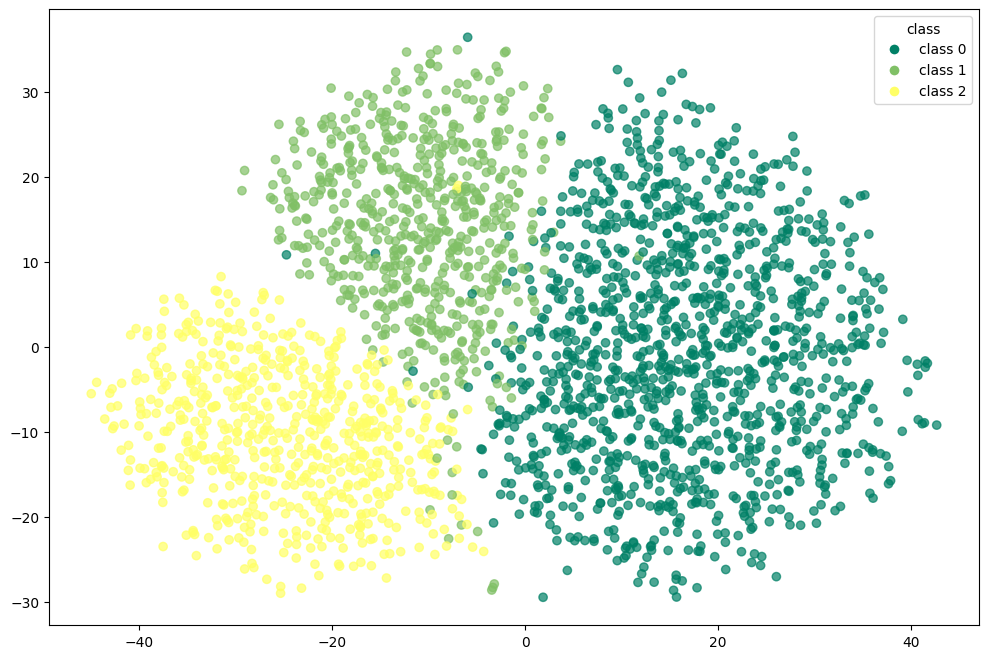

In [281]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

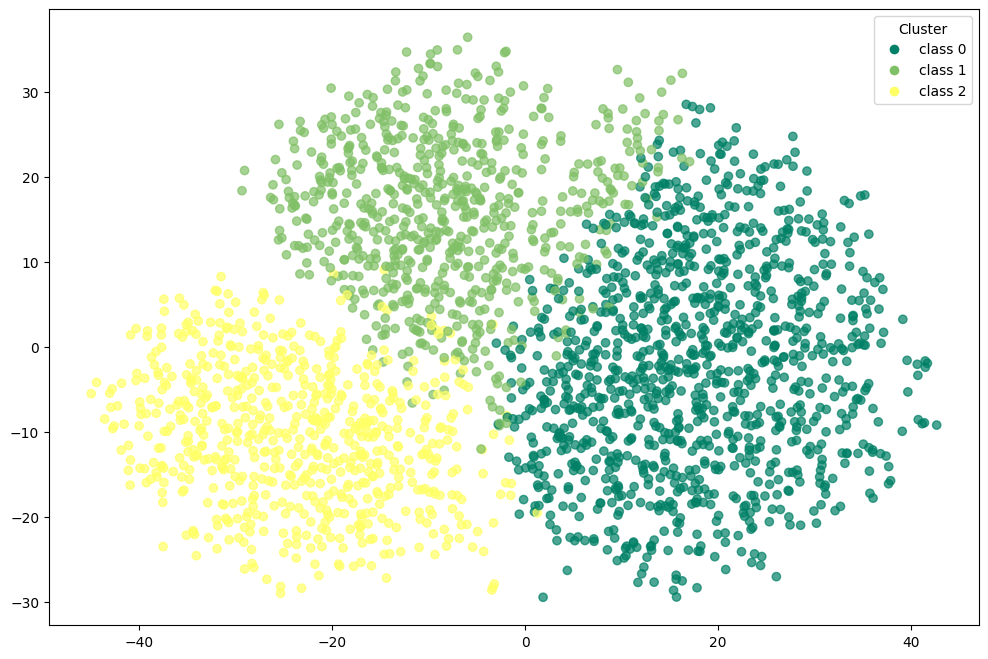

In [282]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [283]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1122  115   13]
 [   2  587   36]
 [   0    2  623]]


In [284]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.90      0.95      1250
           1       0.83      0.94      0.88       625
           2       0.93      1.00      0.96       625

    accuracy                           0.93      2500
   macro avg       0.92      0.94      0.93      2500
weighted avg       0.94      0.93      0.93      2500



In [285]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.8128209770499456

In [286]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.7791017402663911

In [287]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.33890923857688904

### pam with umap

In [288]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [289]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [290]:
pam_umap = kmedoids(X_umap.values.tolist(),initial_medoids,metric=metric)

In [291]:
pam_umap.process()

In [292]:
clusters = pam_umap.get_clusters()

In [293]:
medoids = pam_umap.get_medoids()

In [294]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [295]:
df_pam_umap = X_umap.copy()

In [296]:
df_pam_umap['pam_umap'] = labels

In [297]:
df_pam_umap['target'] = corr_dataset['target']

In [298]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap,target
0,11.330358,3.415561,4.021476,2.0,0
1,11.536426,2.995864,3.383035,2.0,0
2,0.527259,3.063997,3.603730,0.0,2
3,12.776800,2.446049,4.531347,2.0,0
4,11.153504,1.900840,3.846563,2.0,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,0.0,2
2496,5.286746,6.800919,4.354907,1.0,1
2497,1.027787,2.506734,4.103840,0.0,2
2498,6.608165,7.033211,4.317453,1.0,1


In [299]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.246
accuracy after: 0.9904


In [300]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap,target
0,11.330358,3.415561,4.021476,0,0
1,11.536426,2.995864,3.383035,0,0
2,0.527259,3.063997,3.603730,2,2
3,12.776800,2.446049,4.531347,0,0
4,11.153504,1.900840,3.846563,0,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,2,2
2496,5.286746,6.800919,4.354907,1,1
2497,1.027787,2.506734,4.103840,2,2
2498,6.608165,7.033211,4.317453,1,1


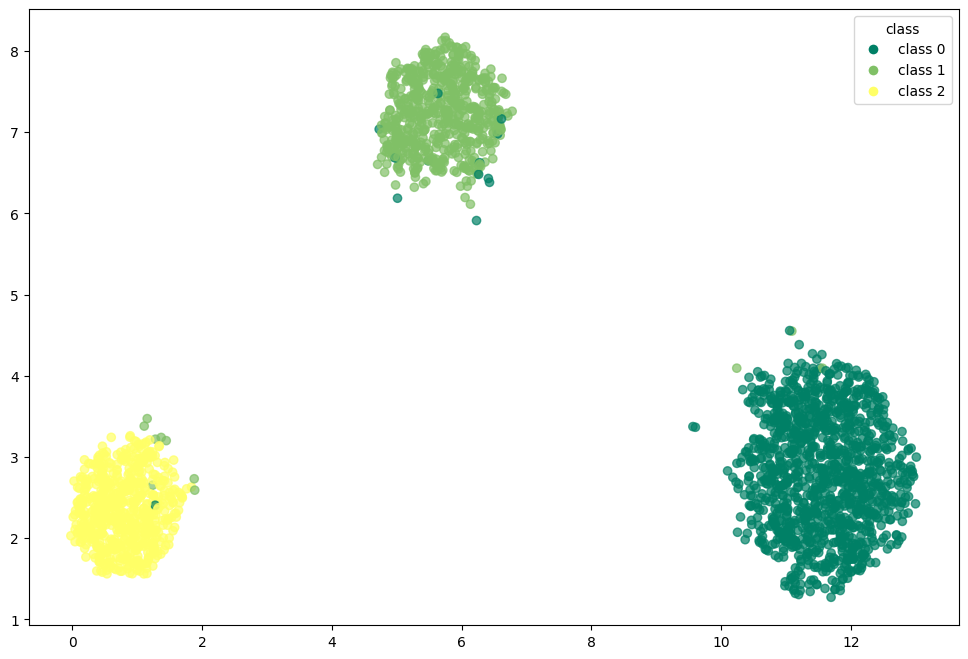

In [301]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

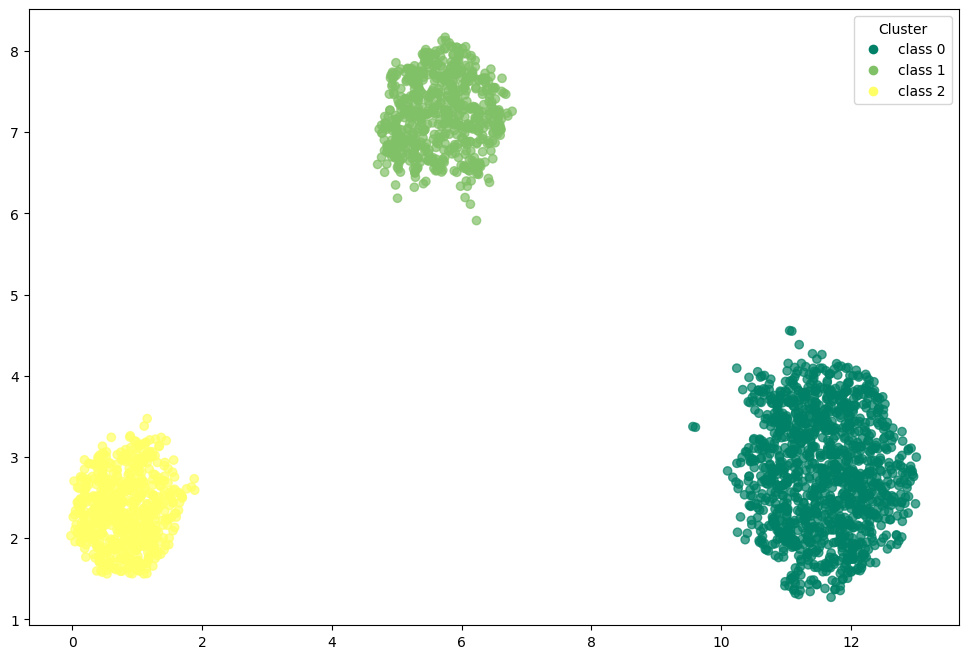

In [302]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [303]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


In [304]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [305]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9729314427440846

In [306]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9484428912497656

In [307]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.8242091536521912

## spectral clustering - GRAPH BASED CLUSTERING ALGORITHM TYPE

**Spectral Clustering** views clustering as a **graph partitioning** problem.  
It constructs a similarity graph where nodes represent data points and edges encode pairwise similarity.  
Then, it uses **eigen-decomposition** of the graph Laplacian to embed points into a new space, where simple clustering (e.g. K-Means) is applied.

1. **Construct similarity graph:** Define edge weights using a kernel (e.g. Gaussian) or k-nearest neighbors.  
2. **Compute Laplacian matrix:** `L = D - W` (or normalized variants).  
3. **Eigen-decomposition:** Extract the first `k` eigenvectors of `L` to create a low-dimensional embedding.  
4. **Clustering step:** Apply K-Means in the spectral space.

This method can capture **non-linear**, **non-convex** cluster structures that K-Means cannot.

**Strengths**
- Detects clusters of arbitrary shape  
- Works with non-linear separations  
- The graph approach captures local structure  

**Weaknesses**
- Building similarity matrix can be costly  
- Requires tuning of kernel parameters  
- Eigen-decomposition is computationally intensive  

In [308]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [309]:
spectral_clustering.fit(X_values)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [310]:
df_spectral = X_values.copy()

In [311]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [312]:
df_spectral['target'] = corr_dataset['target']

In [313]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,spectral_clustering,target
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,1,0
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,1,0
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,2,2
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,1,0
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,2,2
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,0,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,2,2
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,0,1


In [314]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.2556
accuracy after: 0.9908


In [315]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,spectral_clustering,target
0,-2.279859,0.354673,1.527050,-0.996902,-1.021443,-0.744531,-1.964782,0.241556,-0.119649,-0.193057,-0.964561,0.866343,0.856496,-2.179100,0.454865,0,0
1,-0.092526,0.798390,1.032232,-0.282453,-0.228329,0.363145,-0.549558,1.449910,0.229486,0.566898,-0.374929,0.249540,-0.111883,-0.924393,-0.807896,0,0
2,0.400987,-0.545716,-1.154766,1.395716,1.621871,1.193519,-0.395330,-1.702168,-1.050740,0.586825,1.047833,-0.218390,-0.777990,0.804870,1.608367,2,2
3,-0.594934,-0.084977,-0.439703,0.582970,0.042442,-1.416405,-1.742540,0.757567,0.856132,-0.108424,0.901871,-0.763820,0.052319,-1.051672,1.423763,0,0
4,-0.948613,1.575791,0.207431,-1.649027,-1.175899,-0.594187,1.969080,0.596244,0.060581,0.762595,-1.288324,0.274056,0.596582,-1.366342,0.208045,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.878700,0.079362,-0.493590,0.312567,0.618451,1.055914,0.603441,-0.701228,0.798023,-1.095558,0.039889,-0.046095,-1.713809,0.616726,0.183565,2,2
2496,-0.436953,0.577304,-0.946366,-1.720768,-0.266665,-0.581361,0.513756,0.417272,-0.746119,0.674088,0.616137,-0.812033,-1.427856,0.234530,-0.791942,1,1
2497,1.052002,-0.962702,0.041928,1.745155,0.678489,1.328838,-0.195166,0.127924,0.256647,-0.175446,0.223459,0.237026,-1.567542,0.512698,0.486697,2,2
2498,-0.297383,-1.452995,-0.300041,0.105028,0.563141,-0.700828,-0.897801,-1.404124,1.183497,-0.449328,1.627461,-1.119396,0.553342,-0.208102,-0.361889,1,1


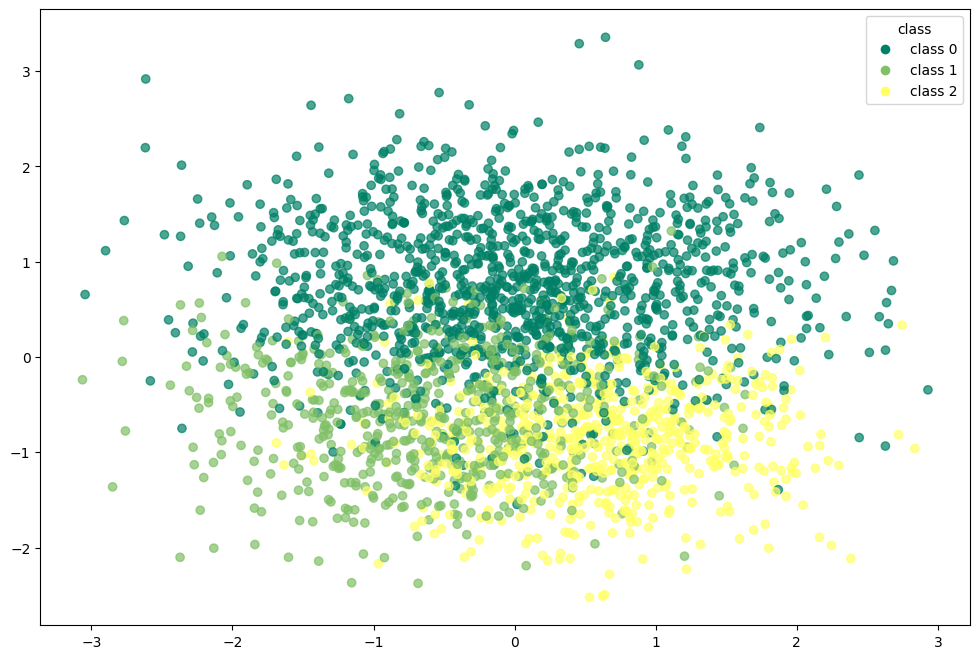

In [316]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

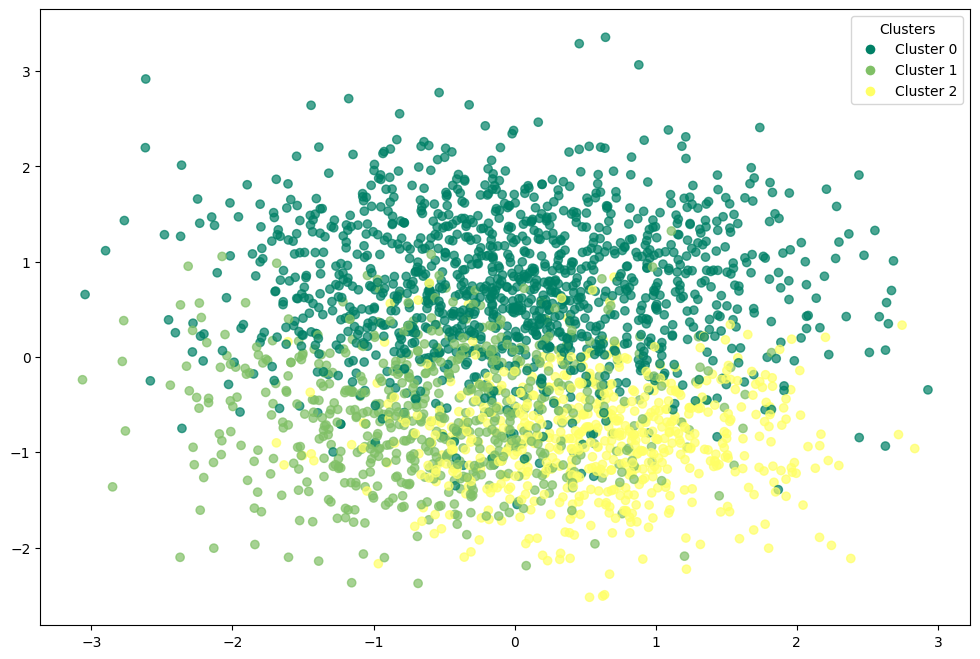

In [317]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [318]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1237   12    1]
 [   3  616    6]
 [   0    1  624]]


In [319]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.99      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [320]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9737513030474981

In [321]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9490322099209615

In [322]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.2095313136498442

### spectral clustering with pca

In [323]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [324]:
spectral_pca.fit(X_pca)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [325]:
df_pca_spectral = X_pca.copy()

In [326]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [327]:
df_pca_spectral['target'] = corr_dataset['target']

In [328]:
df_pca_spectral

,dim_1,dim_2,spectral_pca,target
0,3.302554,1.165642,1,0
1,1.760138,0.031350,1,0
2,-2.896813,-0.570498,2,2
3,0.779225,0.033066,1,0
4,2.486562,0.038089,1,0
...,...,...,...,...
2495,-2.297848,-1.418125,2,2
2496,-0.186148,1.385988,0,1
2497,-1.984767,-1.417433,2,2
2498,-1.298994,1.243779,0,1


In [329]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.2536
accuracy after: 0.9884


In [330]:
df_pca_spectral

,dim_1,dim_2,spectral_pca,target
0,3.302554,1.165642,0,0
1,1.760138,0.031350,0,0
2,-2.896813,-0.570498,2,2
3,0.779225,0.033066,0,0
4,2.486562,0.038089,0,0
...,...,...,...,...
2495,-2.297848,-1.418125,2,2
2496,-0.186148,1.385988,1,1
2497,-1.984767,-1.417433,2,2
2498,-1.298994,1.243779,1,1


In [331]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1241    8    1]
 [   5  609   11]
 [   0    4  621]]


In [332]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.97      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [333]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.9696101678515635

In [334]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.937044539790279

In [335]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.6065803334043983

### spectral clustering with t-SNE

In [336]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [337]:
spectral_tsne.fit(X_tsne)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [338]:
df_tsne_spectral = X_tsne.copy()

In [339]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [340]:
df_tsne_spectral['target'] = corr_dataset['target']

In [341]:
df_tsne_spectral

,dim_1,dim_2,dim_3,spectral_tsne,target
0,2.993417,1.466981,4.298259,1,0
1,18.101969,3.602019,-9.118330,1,0
2,-23.710184,-24.853226,-5.859434,2,2
3,31.015869,5.337931,-11.716872,1,0
4,8.539289,-23.890591,-4.554605,1,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,2,2
2496,-13.461441,2.161455,24.117638,0,1
2497,-31.398249,-9.028354,-15.616220,2,2
2498,-17.318478,12.477765,-6.362691,0,1


In [342]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.262
accuracy after: 0.9804


In [343]:
df_tsne_spectral

,dim_1,dim_2,dim_3,spectral_tsne,target
0,2.993417,1.466981,4.298259,0,0
1,18.101969,3.602019,-9.118330,0,0
2,-23.710184,-24.853226,-5.859434,2,2
3,31.015869,5.337931,-11.716872,0,0
4,8.539289,-23.890591,-4.554605,0,0
...,...,...,...,...,...
2495,-21.188536,0.642407,8.198753,2,2
2496,-13.461441,2.161455,24.117638,1,1
2497,-31.398249,-9.028354,-15.616220,2,2
2498,-17.318478,12.477765,-6.362691,1,1


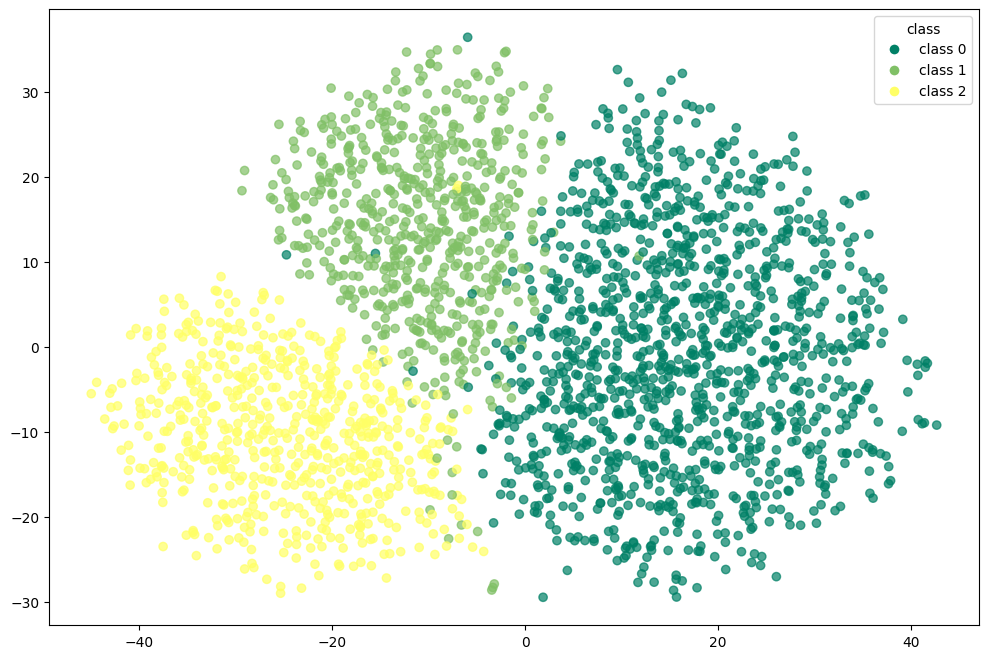

In [344]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

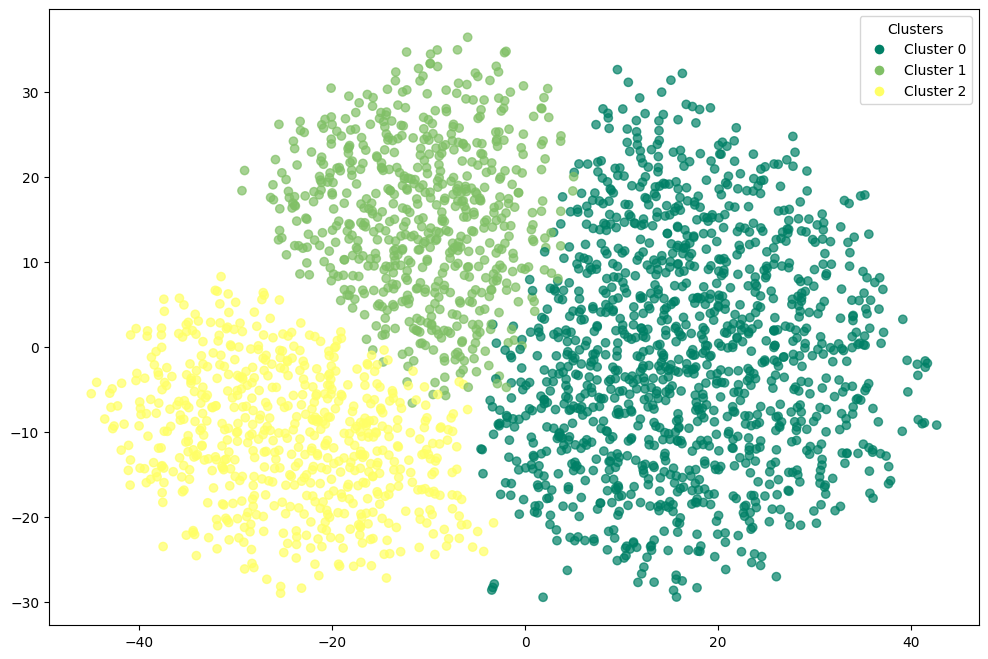

In [345]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [346]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1226   22    2]
 [  10  602   13]
 [   0    2  623]]


In [347]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1250
           1       0.96      0.96      0.96       625
           2       0.98      1.00      0.99       625

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [348]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9447137906717448

In [349]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9045597439719204

In [350]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.3307882249355316

### spectral clustering with umap

In [351]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [352]:
spectral_umap.fit(X_umap)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [353]:
df_umap_spectral = X_umap.copy()

In [354]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [355]:
df_umap_spectral['target'] = corr_dataset['target']

In [356]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,11.330358,3.415561,4.021476,1,0
1,11.536426,2.995864,3.383035,1,0
2,0.527259,3.063997,3.603730,2,2
3,12.776800,2.446049,4.531347,1,0
4,11.153504,1.900840,3.846563,1,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,2,2
2496,5.286746,6.800919,4.354907,0,1
2497,1.027787,2.506734,4.103840,2,2
2498,6.608165,7.033211,4.317453,0,1


In [357]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.256
accuracy after: 0.9904


In [358]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,11.330358,3.415561,4.021476,0,0
1,11.536426,2.995864,3.383035,0,0
2,0.527259,3.063997,3.603730,2,2
3,12.776800,2.446049,4.531347,0,0
4,11.153504,1.900840,3.846563,0,0
...,...,...,...,...,...
2495,1.328441,2.375354,3.297320,2,2
2496,5.286746,6.800919,4.354907,1,1
2497,1.027787,2.506734,4.103840,2,2
2498,6.608165,7.033211,4.317453,1,1


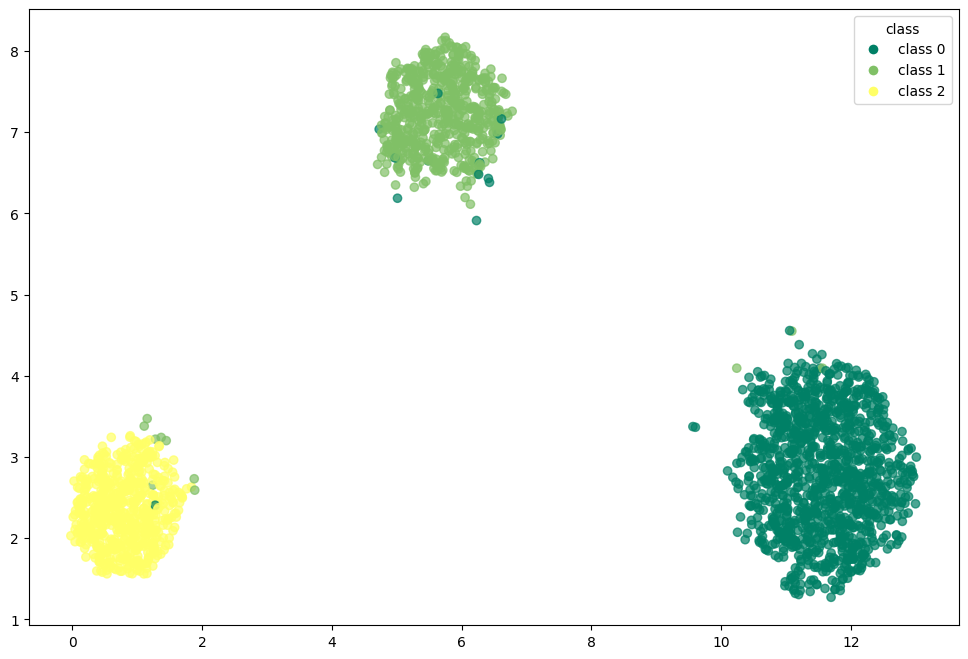

In [359]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

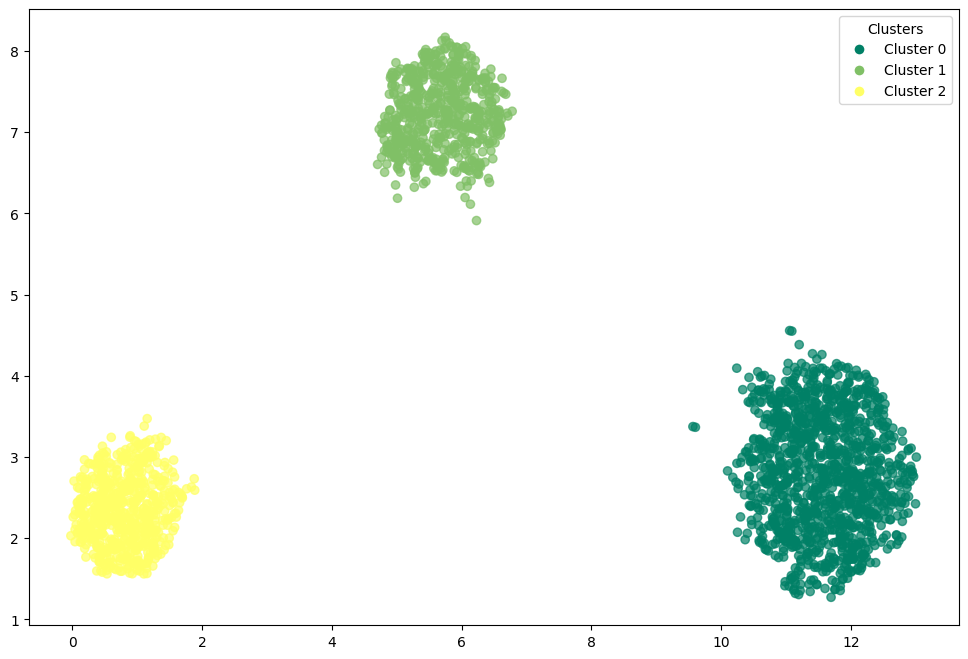

In [360]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [361]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


In [362]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [363]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.9729314427440846

In [364]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.9484428912497656

In [365]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.8242091536521912

# accuracy and confusion matrix 

## k-means

In [366]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.97      0.99      0.98       625
           2       0.98      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [367]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1233   15    2]
 [   1  616    8]
 [   0    2  623]]


## k-menas + pca

In [368]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1250
           1       0.97      0.99      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.98      2500
weighted avg       0.99      0.99      0.99      2500



In [369]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1229   18    3]
 [   0  616    9]
 [   0    4  621]]


## k-means + t-SNE

In [370]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.87      0.93      1250
           1       0.79      0.94      0.86       625
           2       0.93      1.00      0.96       625

    accuracy                           0.92      2500
   macro avg       0.91      0.94      0.92      2500
weighted avg       0.93      0.92      0.92      2500



In [371]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1083  155   12]
 [   2  589   34]
 [   0    2  623]]


## k-means + UMAP

In [372]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [373]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


## Birch

In [374]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1250
           1       0.94      0.98      0.96       625
           2       0.99      0.97      0.98       625

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [375]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[1228   21    1]
 [   8  614    3]
 [   0   16  609]]


## Birch + pca

In [376]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.97      0.98      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [377]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[1236   12    2]
 [   3  613    9]
 [   0    4  621]]


## Birch + t-SNE

In [378]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1250
           1       0.93      0.91      0.92       625
           2       0.97      1.00      0.98       625

    accuracy                           0.96      2500
   macro avg       0.96      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [379]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[1209   38    3]
 [  45  566   14]
 [   0    2  623]]


## Birch + UMAP

In [380]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [381]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


## GMM

In [382]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1250
           1       0.99      1.00      0.99       625
           2       1.00      1.00      1.00       625

    accuracy                           1.00      2500
   macro avg       0.99      1.00      0.99      2500
weighted avg       1.00      1.00      1.00      2500



In [383]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1241    9    0]
 [   1  622    2]
 [   0    0  625]]


## GMM + pca

In [384]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [385]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1240   10    0]
 [   4  614    7]
 [   0    4  621]]


## GMM + t-SNE

In [386]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.84      0.91      1250
           1       0.75      0.94      0.83       625
           2       0.94      1.00      0.96       625

    accuracy                           0.90      2500
   macro avg       0.89      0.92      0.90      2500
weighted avg       0.92      0.90      0.90      2500



In [387]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1044  197    9]
 [   5  586   34]
 [   0    3  622]]


## GMM + UMAP

In [388]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



In [389]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


## PAM

In [390]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1095  147    8]
 [   0  622    3]
 [   0    7  618]]


In [391]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      0.88      0.93      1250
           1       0.80      1.00      0.89       625
           2       0.98      0.99      0.99       625

    accuracy                           0.93      2500
   macro avg       0.93      0.95      0.94      2500
weighted avg       0.95      0.93      0.94      2500



## PAM + pca

In [392]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1229   18    3]
 [   0  616    9]
 [   0    4  621]]


In [393]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1250
           1       0.97      0.99      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.98      0.99      0.98      2500
weighted avg       0.99      0.99      0.99      2500



## PAM + t-SNE

In [394]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1122  115   13]
 [   2  587   36]
 [   0    2  623]]


In [395]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.90      0.95      1250
           1       0.83      0.94      0.88       625
           2       0.93      1.00      0.96       625

    accuracy                           0.93      2500
   macro avg       0.92      0.94      0.93      2500
weighted avg       0.94      0.93      0.93      2500



## PAM + umap

In [396]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


In [397]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



## spectral clustering

In [398]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1237   12    1]
 [   3  616    6]
 [   0    1  624]]


In [399]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.99      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



## spectral clustering + pca

In [400]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1241    8    1]
 [   5  609   11]
 [   0    4  621]]


In [401]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.97      0.98       625
           2       0.98      0.99      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



## spectral clustering + t-SNE

In [402]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1226   22    2]
 [  10  602   13]
 [   0    2  623]]


In [403]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1250
           1       0.96      0.96      0.96       625
           2       0.98      1.00      0.99       625

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



## spectral clustering + umap

In [404]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1237   12    1]
 [   3  614    8]
 [   0    0  625]]


In [405]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       0.98      0.98      0.98       625
           2       0.99      1.00      0.99       625

    accuracy                           0.99      2500
   macro avg       0.99      0.99      0.99      2500
weighted avg       0.99      0.99      0.99      2500



# external measures  

## k-means

In [406]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [407]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.969
NMI: 0.941
Silhouette: 0.210


## k-means + pca

In [408]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [409]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.962
NMI: 0.931
Silhouette: 0.606


## k-means + tsne

In [410]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [411]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.772
NMI: 0.755
Silhouette: 0.340


## k-means + umap

In [412]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [413]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.973
NMI: 0.948
Silhouette: 0.824


##  Birch 

In [414]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [415]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.946
NMI: 0.905
Silhouette: 0.205


## Birch + pca

In [416]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [417]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.967
NMI: 0.935
Silhouette: 0.607


## Birch + tsne

In [418]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [419]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.882
NMI: 0.833
Silhouette: 0.327


## Birch + umap

In [420]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [421]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.973
NMI: 0.948
Silhouette: 0.824


## GMM

In [422]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [423]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.986
NMI: 0.973
Silhouette: 0.210


## GMM + pca

In [424]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [425]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.973
NMI: 0.945
Silhouette: 0.606


## GMM + tsne

In [426]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [427]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.728
NMI: 0.726
Silhouette: 0.338


## GMM + umap

In [428]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [429]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.973
NMI: 0.948
Silhouette: 0.824


## pam

In [430]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [431]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.806
NMI: 0.804
Silhouette: 0.215


## pam + pca

In [432]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [433]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.962
NMI: 0.931
Silhouette: 0.606


## pam + tsne

In [434]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [435]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.813
NMI: 0.779
Silhouette: 0.339


## pca + umap

In [436]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [437]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.973
NMI: 0.948
Silhouette: 0.824


## spectral clustering

In [438]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [439]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.974
NMI: 0.949
Silhouette: 0.210


## spectral clustering + pca

In [440]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [441]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.970
NMI: 0.937
Silhouette: 0.607


## spectral clustering + tsne

In [442]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [443]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.945
NMI: 0.905
Silhouette: 0.331


## spectral clustering + umap

In [444]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [445]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.973
NMI: 0.948
Silhouette: 0.824


# final metrics

| Metric | Requires Ground Truth | Score Range | Meaning |
|--------|---------------------|------------|---------|
| **ARI** | ✅ | [-1, 1] | 1 = perfect match, 0 = random, <0 worse than chance |
| **NMI** | ✅ | [0, 1] | 1 = perfect match, 0 = independent |
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-separated, 0 = boundary, <0 = misclassified |

In [446]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.969  0.941       0.210
k-means + pca               0.962  0.931       0.606
k-means + tsne              0.772  0.755       0.340
k-means + umap              0.973  0.948       0.824
Birch                       0.946  0.905       0.205
Birch + pca                 0.967  0.935       0.607
Birch + tsne                0.882  0.833       0.327
Birch + umap                0.973  0.948       0.824
GMM                         0.986  0.973       0.210
GMM + pca                   0.973  0.945       0.606
GMM + tsne                  0.728  0.726       0.338
GMM + umap                  0.973  0.948       0.824
PAM                         0.806  0.804       0.215
PAM + pca                   0.962  0.931       0.606
PAM + tsne                  0.813  0.779       0.339
PAM + umap                  0.973  0.948       0.824
Spectral Clustering         0.974  0.949       0.210
Spectral Clustering + pca   0.970  0.937      

In [447]:
if N_SAMPLE == 2500 and N_FEATURES == 15:
    folder = "2500_15"
elif N_SAMPLE == 5000 and N_FEATURES == 10:
    folder = "5000_10"
elif N_SAMPLE == 10000 and N_FEATURES == 5:
    folder = "10000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)

## ARI index

The **Adjusted Rand Index (ARI)** is a measure of similarity between two clusterings — typically the ground truth labels and the predicted cluster labels.  
It quantifies how well the clustering algorithm recovers the true class structure while correcting for chance.  

1. Count pairs of points that are either:
   - in the same cluster in both labelings (**agreement**)  
   - in different clusters in both labelings (**agreement**)  
2. Compute the **Rand Index (RI)** as the ratio of agreements to total pairs.  
3. Adjust the RI for chance grouping to get **ARI**, which can be negative (worse than random), 0 (random), or 1 (perfect agreement).

**Strengths**
- Adjusts for chance; more reliable than raw Rand Index  
- Works for any number of clusters and unbalanced datasets  

**Weaknesses**
- Requires **ground truth labels**  
- Not meaningful if true labels are unknown  


In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_8.csv').rename(columns={'Unnamed: 0':'Algorithms'})

FileNotFoundError: [Errno 2] No such file or directory: './2500_15/X_3_0.1_20.csv'

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_8.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_8.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
ari = {}

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 20'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 15'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 10'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 20'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 15'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 10'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 20'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 15'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 10'):df_7_cluster['ARI'].values,
        }
)

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"ari_dataset/ari_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [ ]:
ari_2500_15 = pd.read_csv("ari_dataset/ari_2500_15.csv", header=[0,1,2])

### dataset

In [ ]:
ari_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari_5000_10 = pd.read_csv("ari_dataset/ari_5000_10.csv", header=[0,1,2])

In [ ]:
ari_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari_10000_5 = pd.read_csv("ari_dataset/ari_10000_5.csv", header=[0,1,2])

In [ ]:
ari_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## NMI index

**Normalized Mutual Information (NMI)** measures the similarity between two clusterings based on **information theory**.  
It quantifies how much information about the true labels is captured by the clustering, normalized to account for differences in cluster sizes and counts.

1. Compute **mutual information (MI)** between the true labels and predicted clusters: how much knowing one reduces uncertainty about the other.  
2. Normalize by the average entropy of the two labelings to scale the score between 0 and 1:
   - `0` → no mutual information (completely independent)  
   - `1` → perfect correlation

**Strengths**
- Scales from 0 to 1, easy to interpret  
- Handles unbalanced clusters  
- Does not require clusters to have the same number of points  

**Weaknesses**
- Requires **ground truth labels**  
- Sensitive to noise and small clusters  

In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_8.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_8.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_8csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
nmi = {}

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 20'):df_3_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 15'):df_3_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 10'):df_3_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 20'):df_5_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 15'):df_5_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 10'):df_5_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 20'):df_7_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 15'):df_7_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 10'):df_7_cluster['NMI'].values,
        }
)

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"nmi_dataset/nmi_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [ ]:
nmi_2500_15 = pd.read_csv("nmi_dataset/nmi_2500_15.csv", header=[0,1,2])

### dataset

In [ ]:
nmi_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi_5000_10 = pd.read_csv("nmi_dataset/nmi_5000_10.csv", header=[0,1,2])

In [ ]:
nmi_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi_10000_5 = pd.read_csv("nmi_dataset/nmi_10000_5.csv", header=[0,1,2])

In [ ]:
nmi_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## Silhouette score 

The **Silhouette Score** is an **intrinsic evaluation metric** that measures how well-separated and cohesive clusters are **without ground truth labels**.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to all points in the **nearest other cluster** (separation).  
3. Silhouette score `s(i)`:

* s(i) = ( b(i) - a(i) ) / max( a(i), b(i) )


4. Overall silhouette score = average of `s(i)` across all points.

- `s ≈ 1` → point is well-matched to its cluster, far from others  
- `s ≈ 0` → point lies near the cluster boundary  
- `s < 0` → point may be misclassified  

**Strengths**
- Works **without ground truth labels**  
- Measures both **cohesion** and **separation**  
- Useful for choosing the **number of clusters**  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to the choice of distance metric  

In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_8.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_8.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_20.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_12.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
silhouette = {}

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 20'):df_3_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 15'):df_3_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 10'):df_3_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 20'):df_5_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 15'):df_5_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 10'):df_5_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 20'):df_7_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 15'):df_7_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 10'):df_7_cluster['Silhouette'].values,
        }
)

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"silhoutte_dataset/silhouette_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [ ]:
silhouette_2500_15 = pd.read_csv("silhoutte_dataset/silhouette_2500_15.csv", header=[0,1,2])

### dataset

In [ ]:
silhouette_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette_5000_10 = pd.read_csv("silhoutte_dataset/silhouette_5000_10.csv", header=[0,1,2])

In [ ]:
silhouette_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette_10000_5 = pd.read_csv("silhoutte_dataset/silhouette_10000_5.csv", header=[0,1,2])

In [ ]:
silhouette_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])